In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scFunctions as sf
import pickle
import matplotlib

sc.settings.verbosity = 3


%config Completer.use_jedi = False

**Loading data and preprocessing**

In [3]:
adata = sc.read_h5ad("../data/MERGED_SEU_REANOTATE.h5ad")
adata

AnnData object with n_obs × n_vars = 119960 × 25572
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population_new'
    var: 'features'

In [4]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 492 genes that are detected in less than 3 cells


In [5]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [6]:
adata = sf.pp_PCA(adata) # Function defined in scFunction.py

# Normalize, Log-transform, select HVG, scale data and perform PCA

normalizing counts per cell
    finished (0:00:02)
extracting highly variable genes
    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:21)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


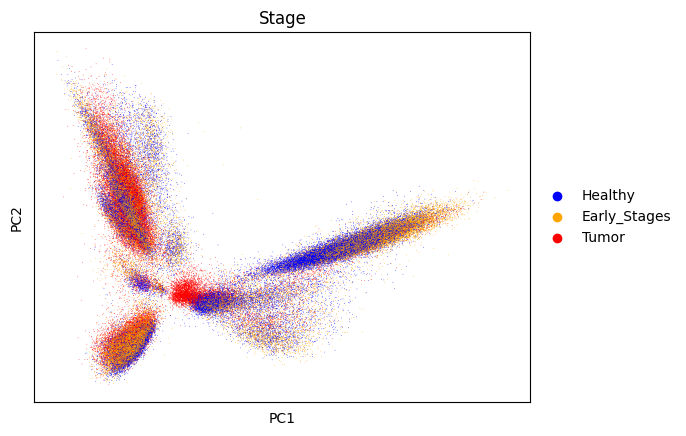

In [7]:
Stage=['Healthy','Early_Stages','Tumor']
adata.obs['Stage']=pd.Categorical(
    values=adata.obs.Stage, categories=Stage, ordered=True)

sc.pl.pca(adata, color = "Stage", palette={"Healthy" : "blue", "Early_Stages" : "orange", "Tumor" : "red"})

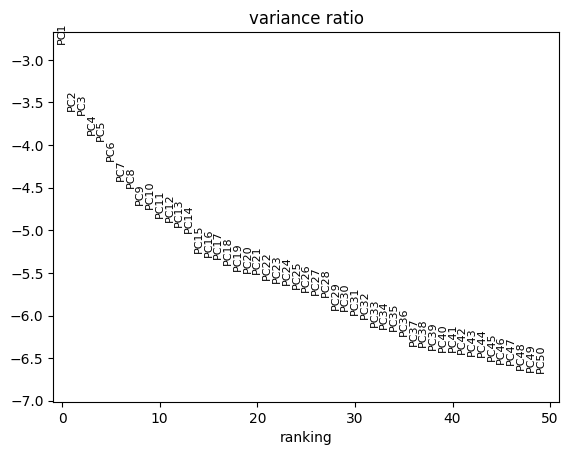

In [8]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs = 50) #ndim = 30

In [9]:
sc.pp.neighbors(adata, n_pcs=30)
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 30


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packag

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:26)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:47)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


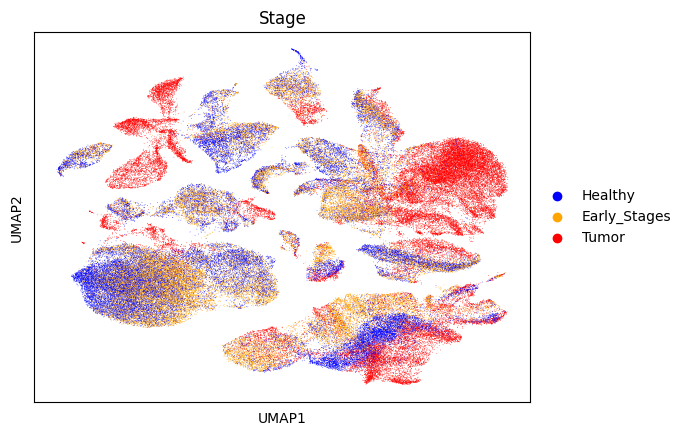

In [71]:
sc.pl.umap(adata, color = 'Stage')

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


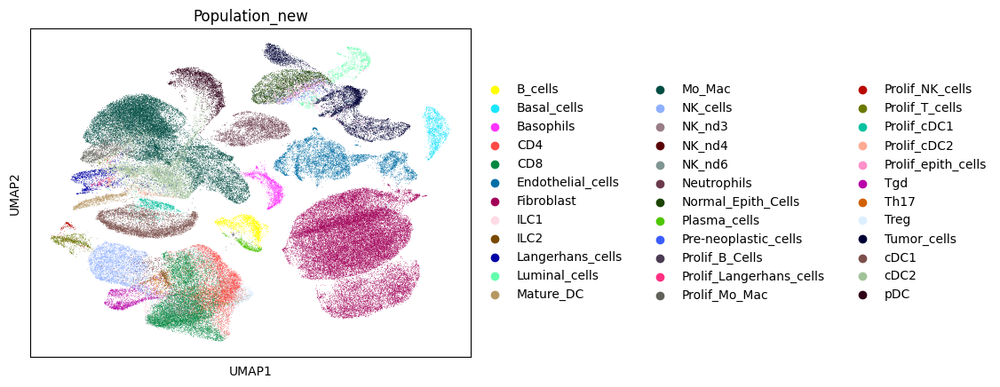

In [11]:
sc.pl.umap(adata, color = "Population_new")

In [2]:
with open("../data/adata_new_orig.pickle", "rb") as f:
    adata = pickle.load(f)

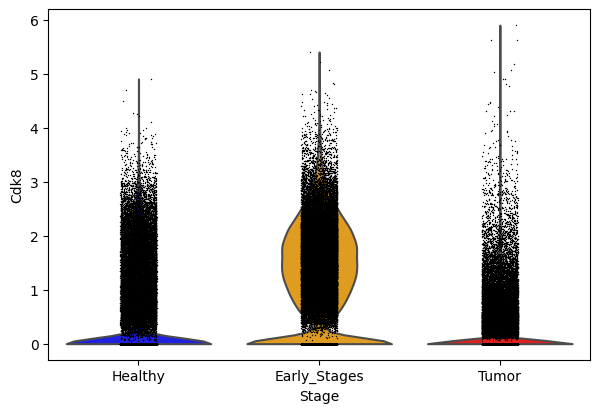

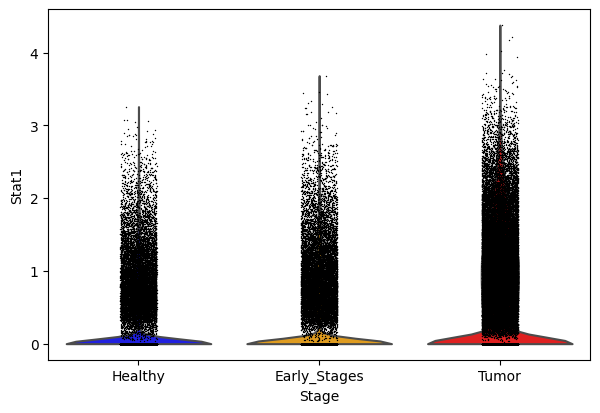

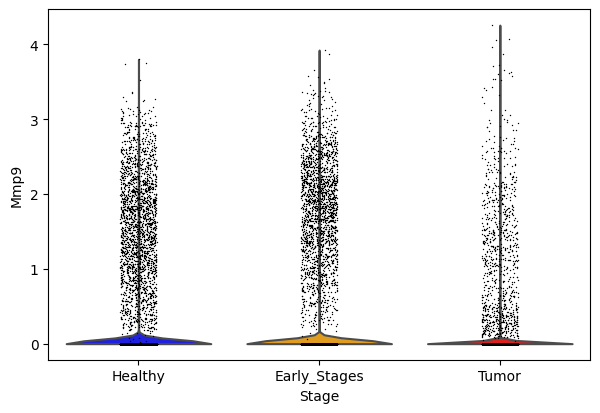

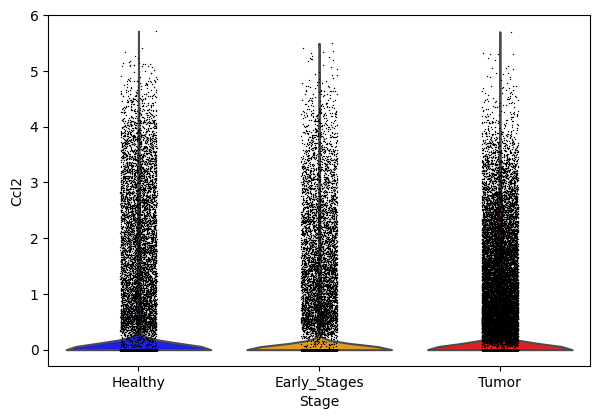

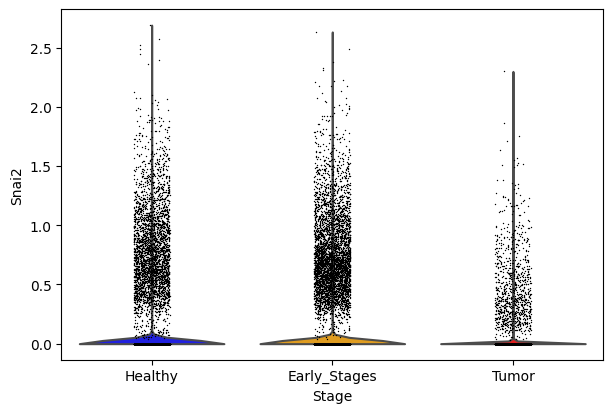

In [3]:
sc.pl.violin(adata, "Cdk8", groupby = 'Stage')

sc.pl.violin(adata, "Stat1", groupby = 'Stage')

sc.pl.violin(adata, "Mmp9", groupby = 'Stage')

sc.pl.violin(adata, "Ccl2", groupby = 'Stage')

sc.pl.violin(adata, "Snai2", groupby = 'Stage')

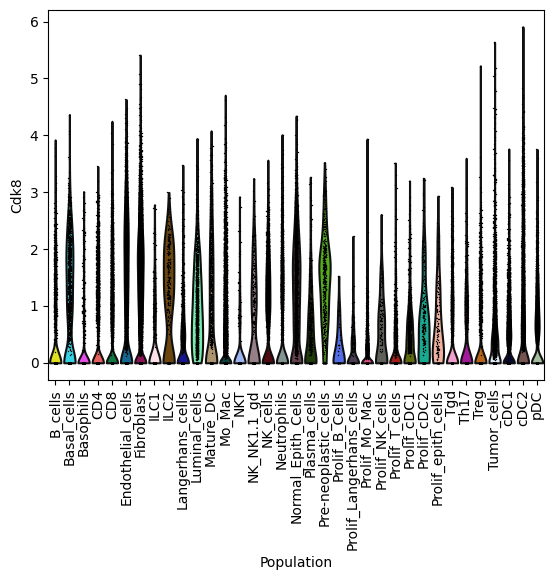

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


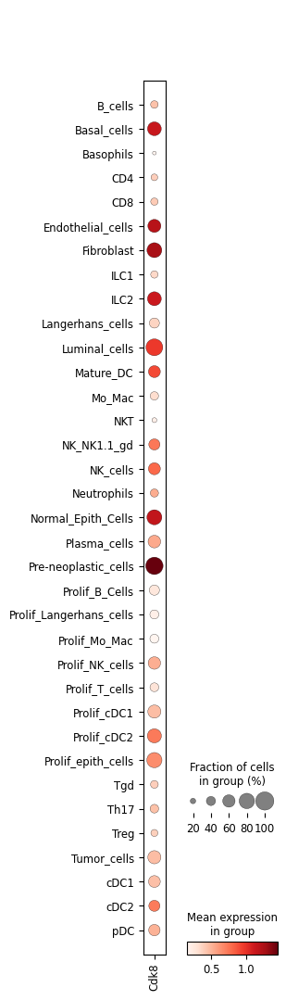

In [4]:
fig, ax = plt.subplots()


plt.xticks(rotation=90)
sc.pl.violin(adata, "Cdk8", groupby = 'Population', ax = ax)

sc.pl.dotplot(adata, "Cdk8", groupby = 'Population')

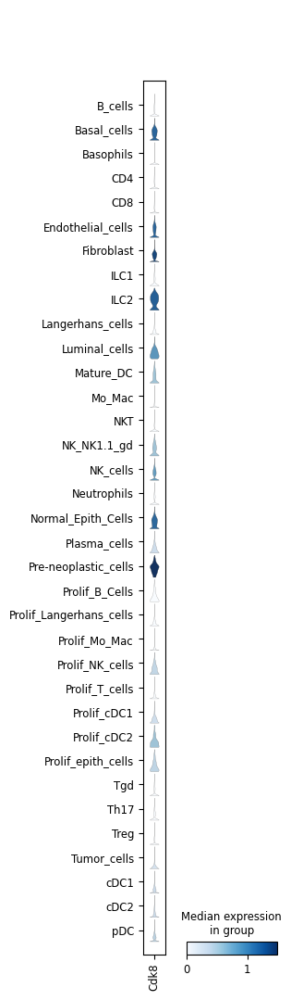

In [5]:
sc.pl.stacked_violin(adata, "Cdk8", groupby = "Population")

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


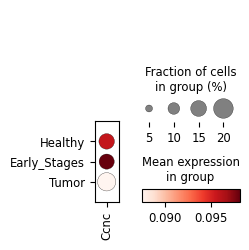

In [6]:
sc.pl.dotplot(adata, "Ccnc", groupby = "Stage")

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


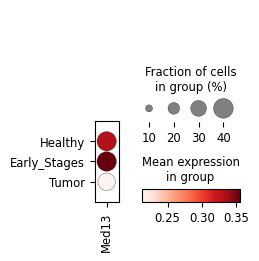

In [7]:
sc.pl.dotplot(adata, "Med13", groupby = 'Stage')

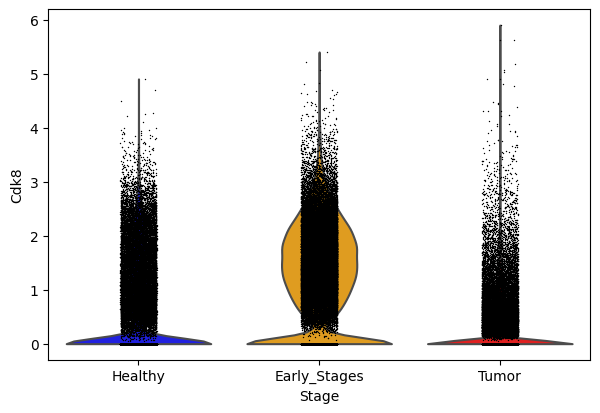

NameError: name 'adata_epi' is not defined

In [8]:
sc.pl.violin(adata, "Cdk8", groupby = 'Stage')
sc.pl.violin(adata_epi, "Cdk8", groupby = 'Stage')
sc.pl.violin(adata, "Ccnc", groupby = 'Stage')
sc.pl.violin(adata, "Med13", groupby = 'Stage')

In [ ]:
sc.pl.dotplot(adata_epi, "Cdk8", groupby = "Stade")

sc.pl.violin(adata_epi, "Cdk8", groupby = "Stade")

ranking genes
    finished: added to `.uns['UP_ES_H_epi']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


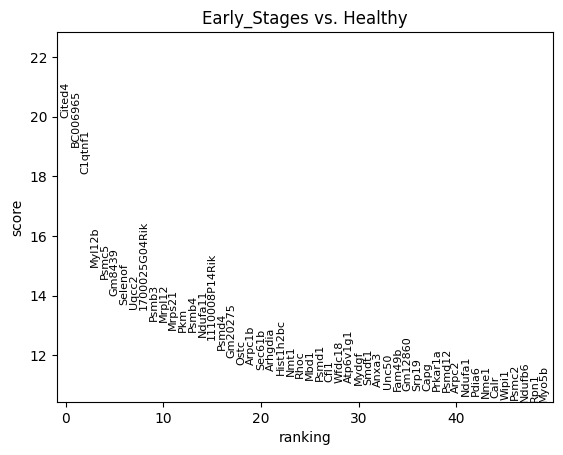

In [76]:
sc.tl.rank_genes_groups(adata_epi, 'Stage', groups=['Early_Stages'], reference='Healthy', method='t-test', key_added = "UP_ES_H_epi")
sc.pl.rank_genes_groups(adata_epi, n_genes=50, key = 'UP_ES_H_epi')

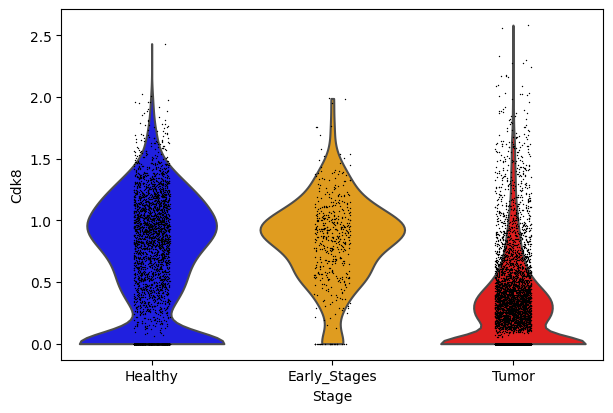

In [70]:
sc.pl.violin(adata_epi, "Cdk8", groupby = "Stage")

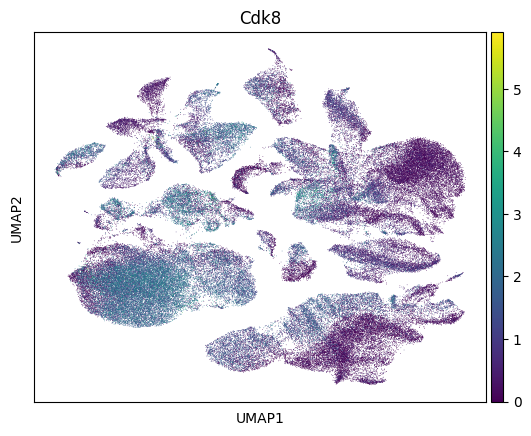

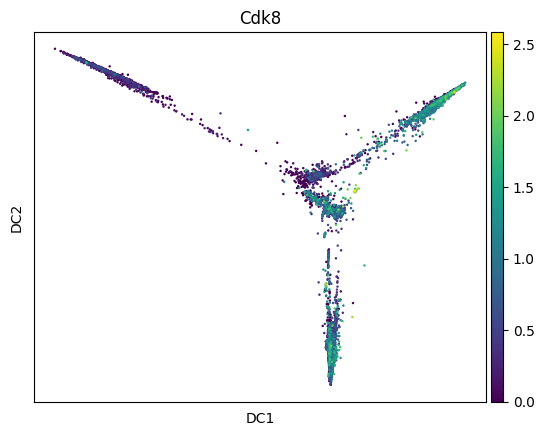

In [44]:
sc.pl.umap(adata, color = "Cdk8")
sc.pl.diffmap(adata_epi, color = "Cdk8")

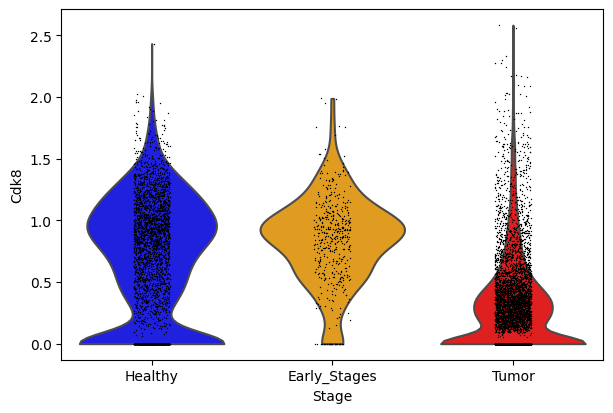

In [5]:
with open("../data/adata_epi_last.pickle", "rb") as f:
    adata_epi = pickle.load(f)
    
sc.pl.violin(adata_epi, "Cdk8", groupby = 'Stage')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:14)


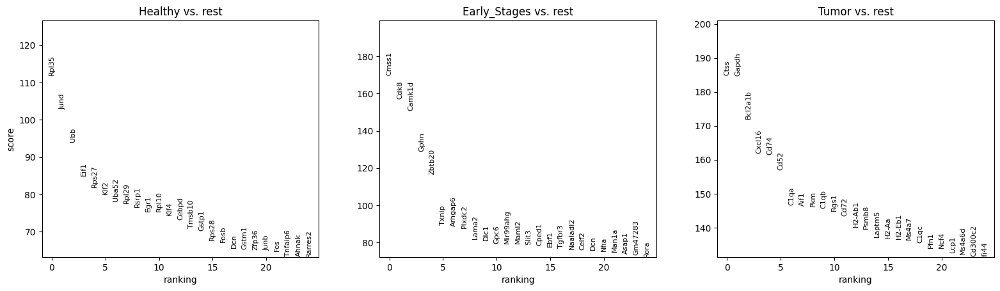

In [10]:
sc.tl.rank_genes_groups(adata, 'Stage', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['UP_ES_H']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:09:46)


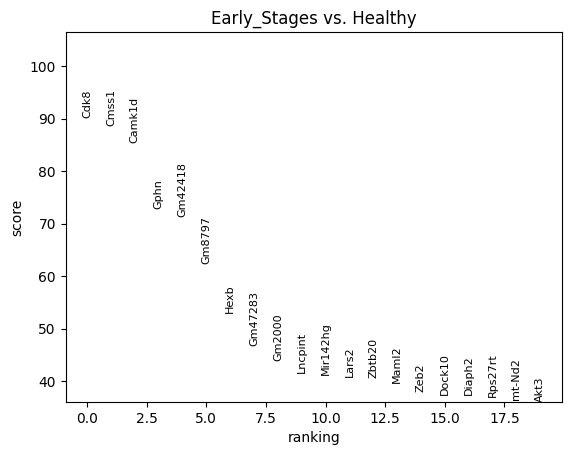

In [14]:
sc.tl.rank_genes_groups(adata, 'Stage', groups=['Early_Stages'], reference='Healthy', method='wilcoxon', key_added = "UP_ES_H")
sc.pl.rank_genes_groups(adata, n_genes=20, key = 'UP_ES_H')

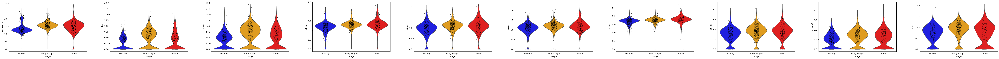

In [61]:
marker_es10 = sc.get.rank_genes_groups_df(adata_pDC, group='Early_Stages', pval_cutoff=0.01, log2fc_min=0)['names'].values[0:10]

sc.pl.violin(adata_pDC, marker_es10, groupby="Stage")

## On garde uniquement les DC

**Preprocessing**

In [10]:
list_DC = ['cDC1', 'cDC2', 'pDC', 'Mature_DC', 'Prolif_cDC1', 'Prolif_cDC2']

adata_DC = adata[adata.obs['Population'].isin(list_DC), :].raw.to_adata().copy()
adata_DC

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/anndata/_core/raw.py:139: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  return anndata.AnnData(


AnnData object with n_obs × n_vars = 16736 × 25572
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population', 'Mouse_ID', 'Week_post Cre_activation', 'Sub_class_Stage', 'Mammary_glands', 'mouse_age_(Week)', 'new_orig'
    var: 'features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'Stage_colors', 'neighbors', 'umap', 'new_orig_colors', 'Population_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [11]:
adata_DC = sf.pp_PCA(adata_DC) # Function defined in scFunction.py

# Normalize, Log-transform, select HVG, scale data and perform PCA

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


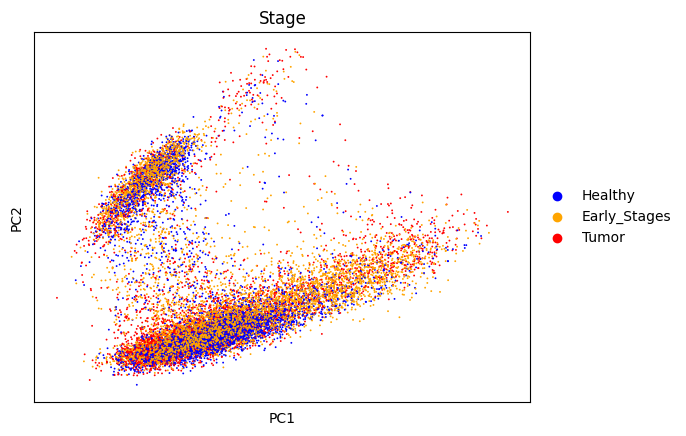

In [12]:
sc.pl.pca(adata_DC, color = "Stage", palette={"Healthy" : "blue", "Early_Stages" : "orange", "Tumor" : "red"})

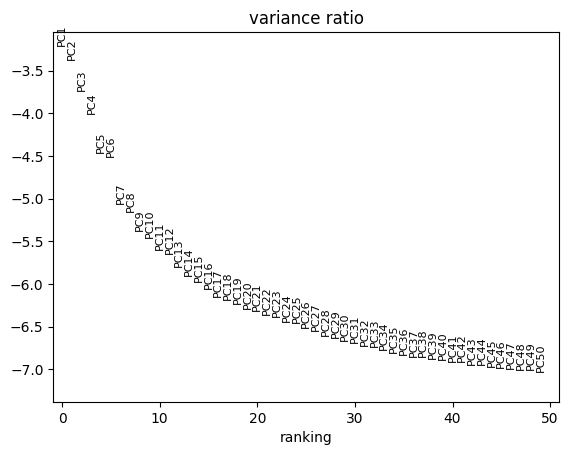

In [13]:
sc.pl.pca_variance_ratio(adata_DC, log=True, n_pcs = 50) #ndim = 20

In [14]:
sc.pp.neighbors(adata_DC, n_pcs=20)
sc.tl.umap(adata_DC)

computing neighbors
    using 'X_pca' with n_pcs = 20


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packag

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:22)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


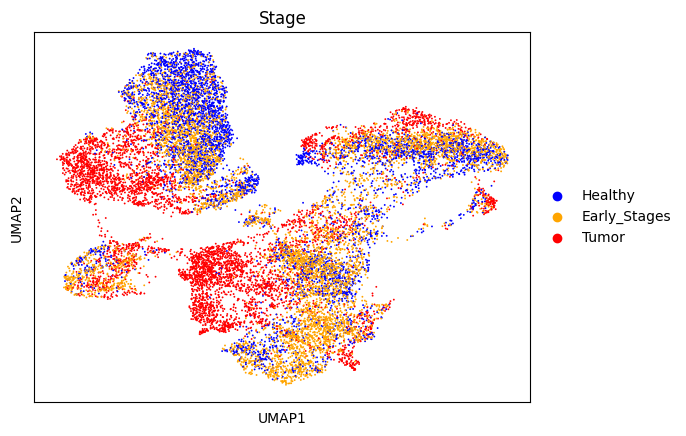

In [15]:
sc.pl.umap(adata_DC, color = 'Stage')

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


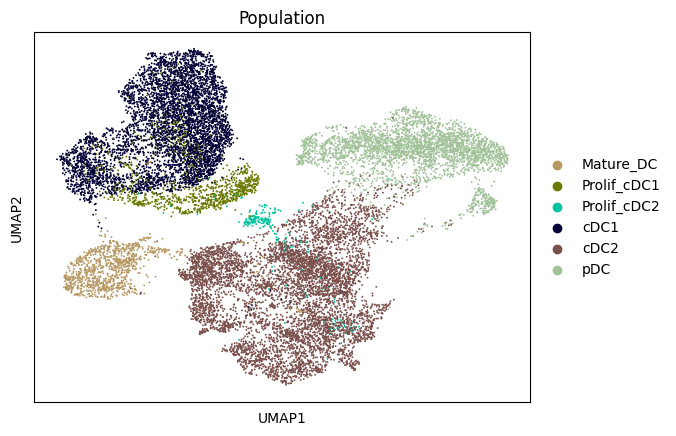

In [16]:
sc.pl.umap(adata_DC, color = 'Population')

Jolie UMAP, les mature DC sont entre les cDC1 et cDC2 et les prolifs DC se rejoignent

In [1]:
sc.tl.louvain(adata_DC)

NameError: name 'sc' is not defined

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


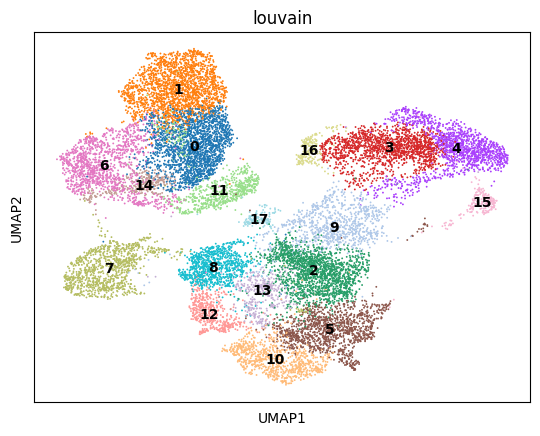

In [18]:
sc.pl.umap(adata_DC, color = 'louvain', legend_loc = "on data")

## Sans les prolifs

In [19]:
list_DC = ['cDC1', 'cDC2', 'pDC', 'Mature_DC']

adata_DC = adata_DC[adata_DC.obs['Population'].isin(list_DC), :].raw.to_adata().copy()
adata_DC

AnnData object with n_obs × n_vars = 15478 × 25572
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population', 'Mouse_ID', 'Week_post Cre_activation', 'Sub_class_Stage', 'Mammary_glands', 'mouse_age_(Week)', 'new_orig', 'louvain'
    var: 'features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'Stage_colors', 'neighbors', 'umap', 'new_orig_colors', 'Population_colors', 'louvain', 'louvain_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


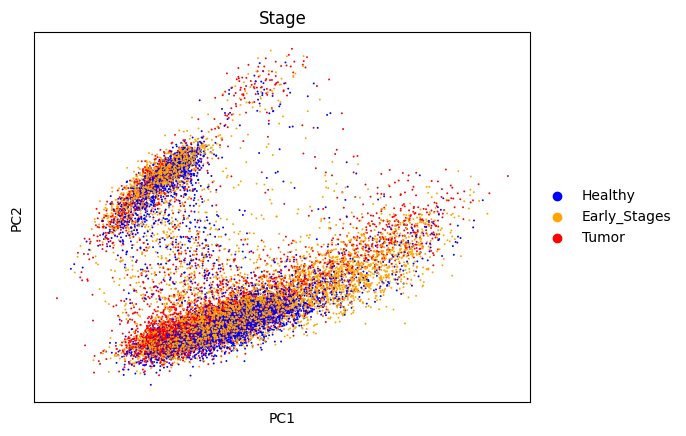

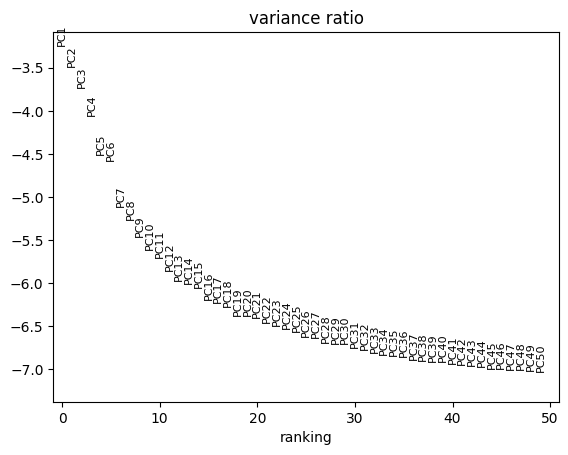

In [20]:
adata_DC = sf.pp_PCA(adata_DC) # Function defined in scFunction.py

# Normalize, Log-transform, select HVG, scale data and perform PCA

sc.pl.pca(adata_DC, color = "Stage", palette={"Healthy" : "blue", "Early_Stages" : "orange", "Tumor" : "red"})
sc.pl.pca_variance_ratio(adata_DC, log=True, n_pcs = 50) #ndim = 30

In [21]:
sc.pp.neighbors(adata_DC, n_pcs=20)
sc.tl.umap(adata_DC)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


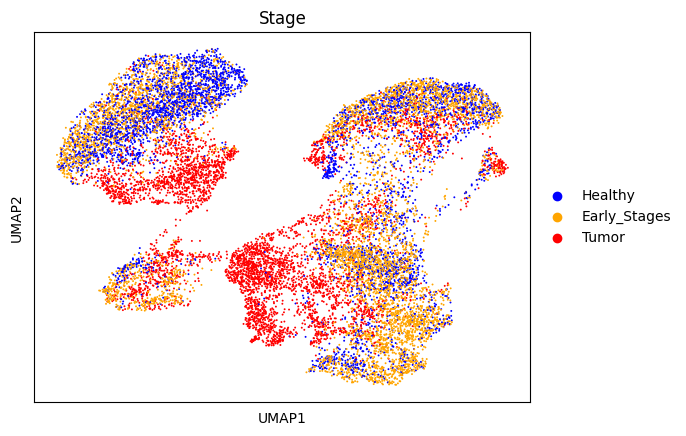

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


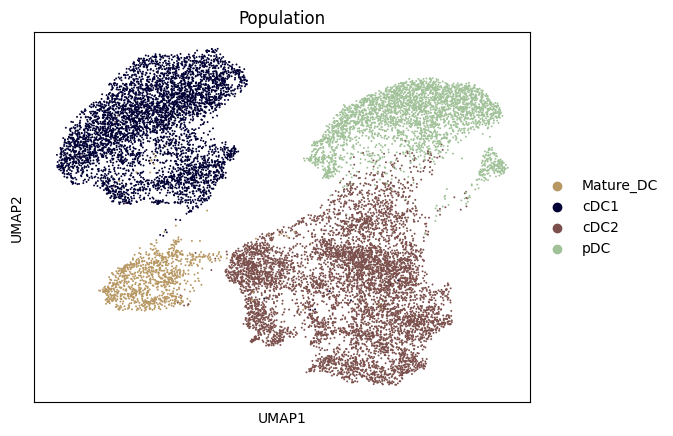

In [23]:
sc.pl.umap(adata_DC, color = 'Stage')
sc.pl.umap(adata_DC, color = 'Population')

## On garde uniquement les pDC

In [33]:
adata_pDC = adata[adata.obs['Population'] == 'pDC', :].raw.to_adata().copy()
adata_pDC

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/anndata/_core/raw.py:139: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  return anndata.AnnData(


AnnData object with n_obs × n_vars = 3153 × 25572
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population', 'Mouse_ID', 'Week_post Cre_activation', 'Sub_class_Stage', 'Mammary_glands', 'mouse_age_(Week)', 'new_orig'
    var: 'features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'Stage_colors', 'neighbors', 'umap', 'new_orig_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [34]:
adata_pDC = sf.pp_PCA(adata_pDC) # Function defined in scFunction.py

# Normalize, Log-transform, select HVG, scale data and perform PCA

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


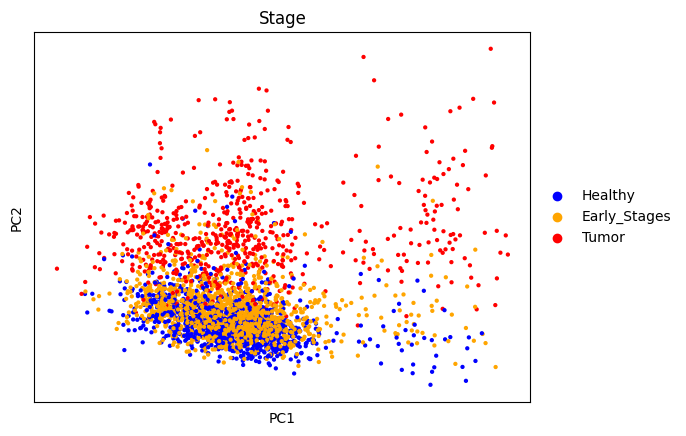

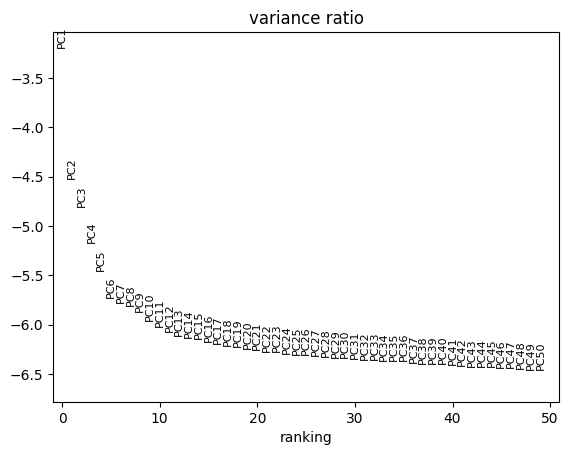

In [35]:
sc.pl.pca(adata_pDC, color = "Stage", palette={"Healthy" : "blue", "Early_Stages" : "orange", "Tumor" : "red"})
sc.pl.pca_variance_ratio(adata_pDC, log=True, n_pcs = 50) #ndim = 10

In [36]:
sc.pp.neighbors(adata_pDC, n_pcs=6)
sc.tl.umap(adata_pDC)

computing neighbors
    using 'X_pca' with n_pcs = 6
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


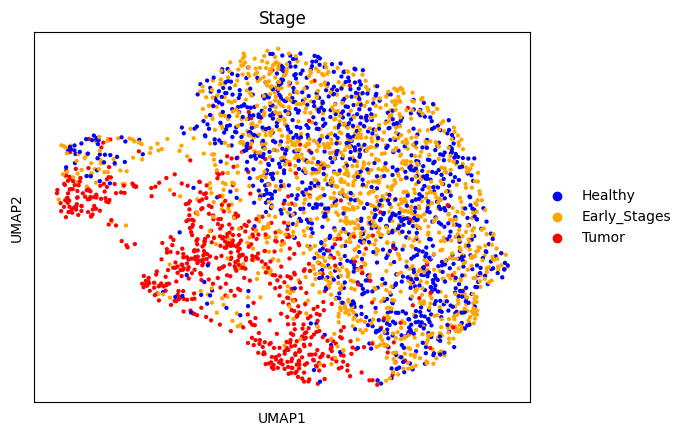

In [37]:
sc.pl.umap(adata_pDC, color = "Stage")

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9881877  0.9823145  0.9647928  0.959335   0.9555444
     0.9423405  0.94008505 0.93284494 0.93125415 0.9228562  0.91471297
     0.9123842  0.8967828  0.892495  ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


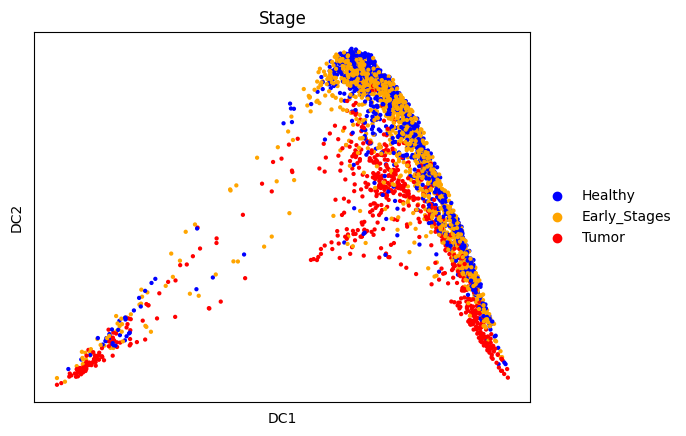

In [38]:
sc.tl.diffmap(adata_pDC)
adata_pDC.obsm["X_diffmap"] = adata_pDC.obsm["X_diffmap"][:, 1:]
sc.pl.diffmap(adata_pDC, color = "Stage")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


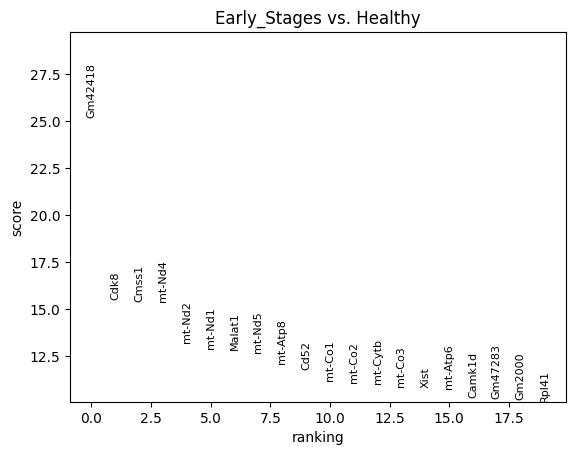

In [53]:
sc.tl.rank_genes_groups(adata_pDC, 'Stage', groups=['Early_Stages'], reference='Healthy', method='wilcoxon')
sc.pl.rank_genes_groups(adata_pDC, n_genes=20)

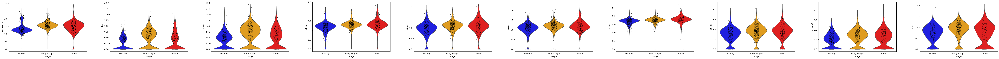

In [61]:
marker_es10 = sc.get.rank_genes_groups_df(adata_pDC, group='Early_Stages', pval_cutoff=0.01, log2fc_min=0)['names'].values[0:10]

sc.pl.violin(adata_pDC, marker_es10, groupby="Stage")

In [65]:
sc.tl.rank_genes_groups(adata_pDC, 'Stage', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:07)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


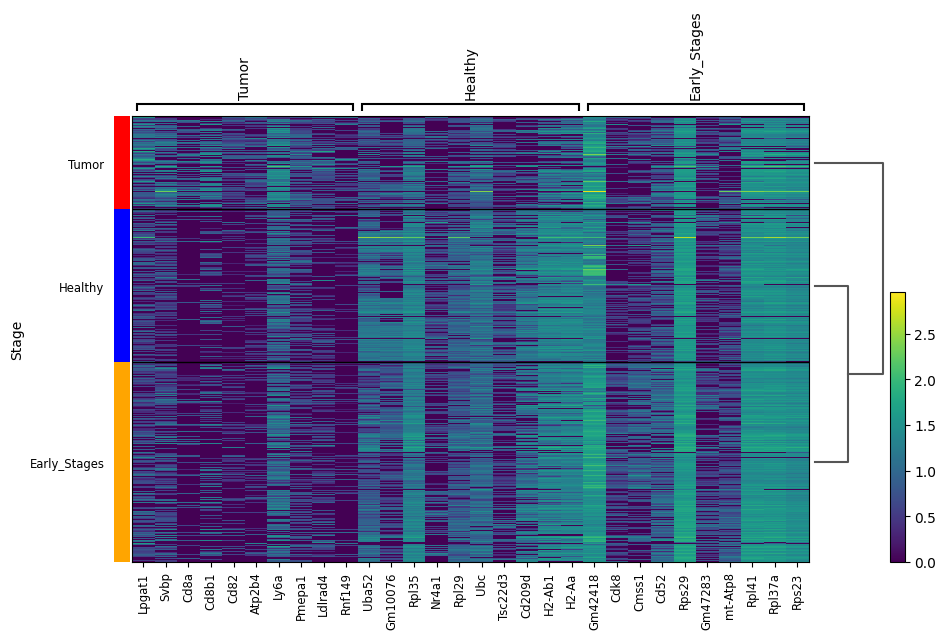

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


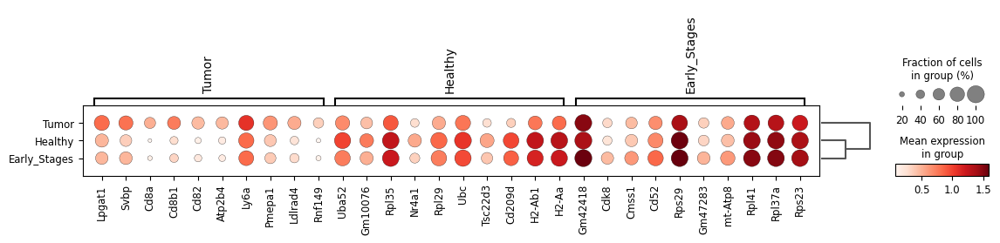

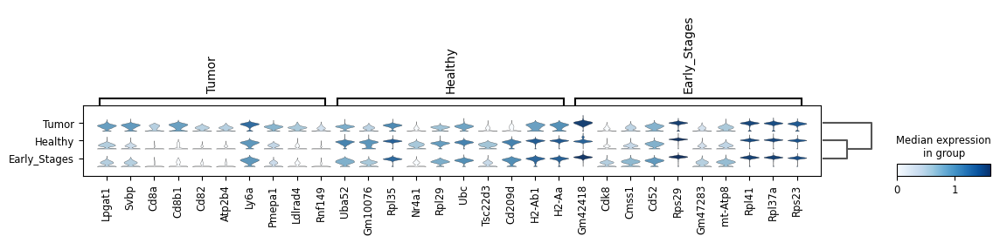

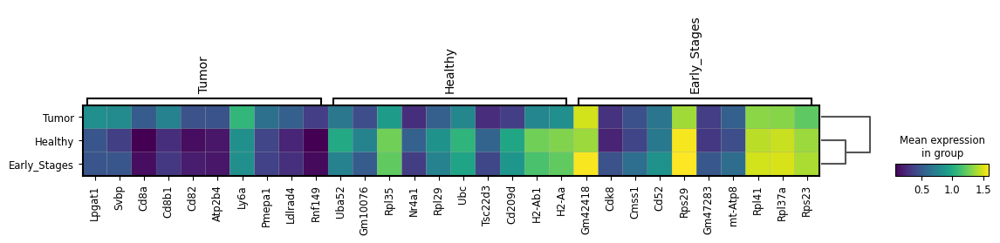

In [70]:
sc.pl.rank_genes_groups_heatmap(adata_pDC, n_genes=10, show_gene_labels=True)
sc.pl.rank_genes_groups_dotplot(adata_pDC, n_genes=10)
sc.pl.rank_genes_groups_stacked_violin(adata_pDC, n_genes=10)
sc.pl.rank_genes_groups_matrixplot(adata_pDC, n_genes=10)

## On garde uniquement les cDC1

In [24]:
adata_cDC1 = adata[adata.obs['Population'] == 'cDC1', :].raw.to_adata().copy()
adata_cDC1

# J'ai retiré les cDC1 en prolif parce qu'ils drivent tout le signal

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/anndata/_core/raw.py:139: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  return anndata.AnnData(


AnnData object with n_obs × n_vars = 5008 × 25572
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population', 'Mouse_ID', 'Week_post Cre_activation', 'Sub_class_Stage', 'Mammary_glands', 'mouse_age_(Week)', 'new_orig'
    var: 'features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'Stage_colors', 'neighbors', 'umap', 'new_orig_colors', 'Population_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [25]:
adata_cDC1 = sf.pp_PCA(adata_cDC1) # Function defined in scFunction.py

# Normalize, Log-transform, select HVG, scale data and perform PCA

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    with n_comps=50
    finished (0:00:00)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


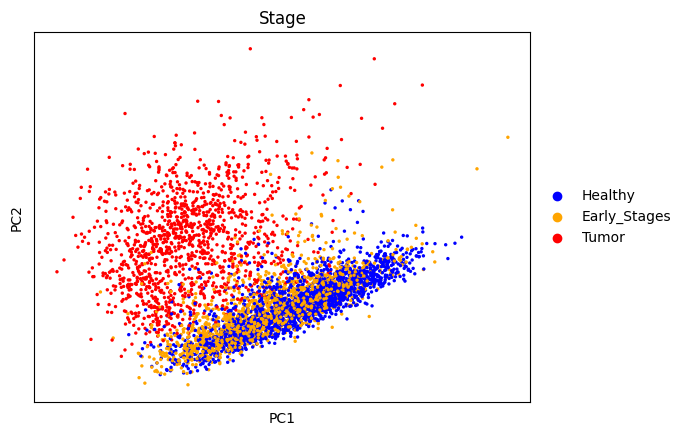

In [26]:
sc.pl.pca(adata_cDC1, color = "Stage", palette={"Healthy" : "blue", "Early_Stages" : "orange", "Tumor" : "red"})

**Le signal intéressant (sain --> tumeur) correspond à la CP 2**

On peut regarder plus en détail les gènes qui correspondent à cette CP

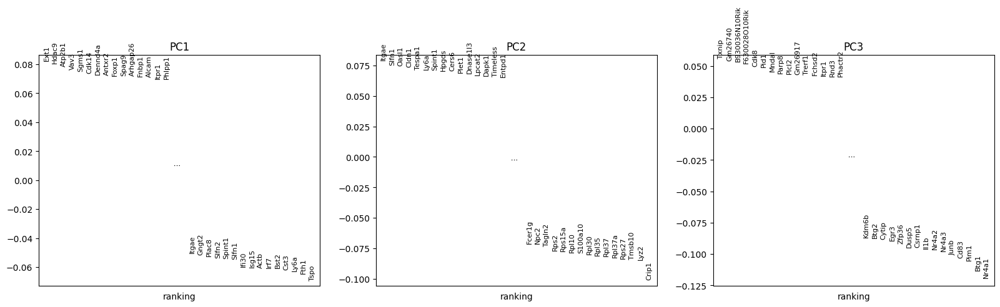

In [74]:
sc.pl.pca_loadings(adata_cDC1, include_lowest=True)

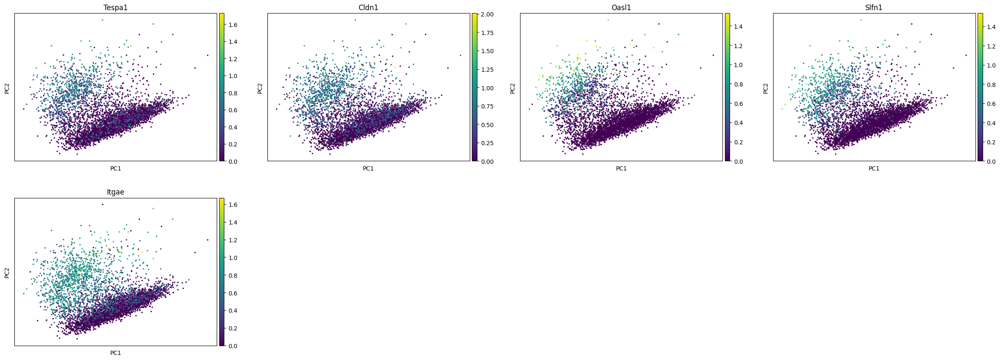

In [27]:
# Get loadings for each gene for each PC
df_loadings = pd.DataFrame(adata_cDC1.varm["PCs"], index=adata_cDC1.var_names)

# Get 5 top genes that drive on the right side of the PC 2
gene_list = df_loadings[1].sort_values().tail().index.tolist()

sc.pl.pca(adata_cDC1, color = gene_list)

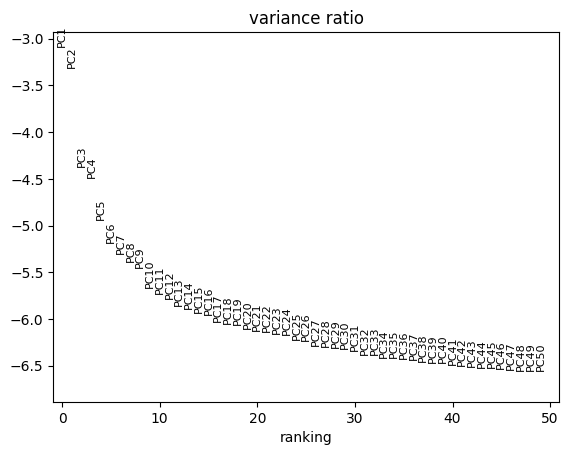

In [28]:
sc.pl.pca_variance_ratio(adata_cDC1, log=True, n_pcs = 50) #ndim = 20

In [29]:
sc.pp.neighbors(adata_cDC1, n_pcs=20)
sc.tl.umap(adata_cDC1)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


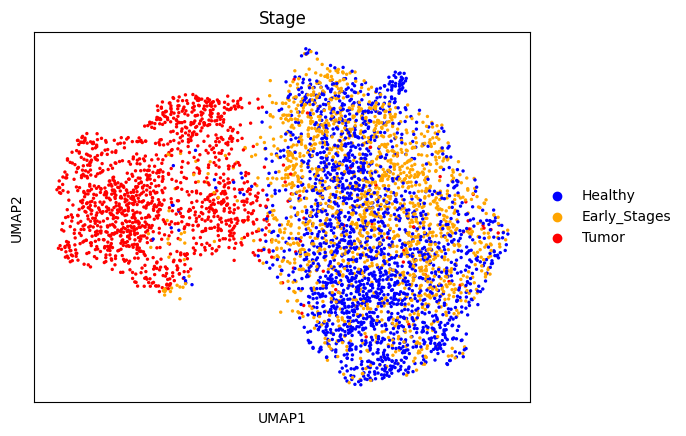

In [30]:
sc.pl.umap(adata_cDC1, color = 'Stage')

Compliqué de faire sortir la différence Healthy/Early (s'il y en a bien une ?)

In [35]:
sc.tl.louvain(adata_cDC1, resolution = 0.6)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 7 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


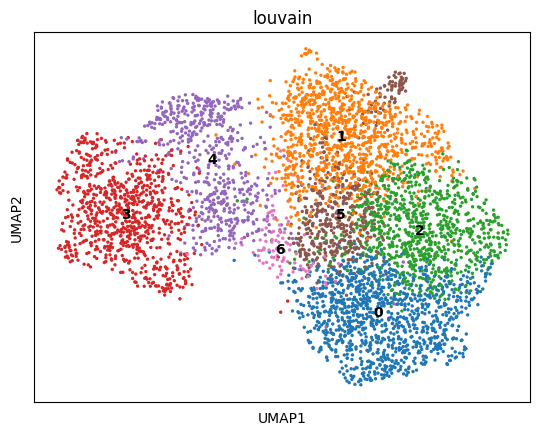

In [36]:
sc.pl.umap(adata_cDC1, color = 'louvain', legend_loc = 'on data')

computing density on 'umap'
--> added
    'umap_density_Stage', densities (adata.obs)
    'umap_density_Stage_params', parameter (adata.uns)


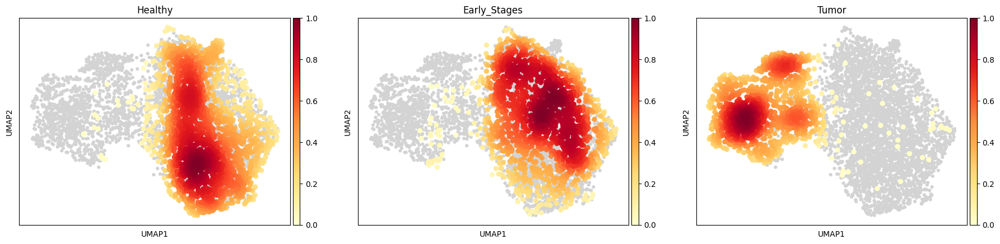

In [37]:
sc.tl.embedding_density(adata_cDC1, groupby="Stage")
sc.pl.embedding_density(adata_cDC1, groupby="Stage")

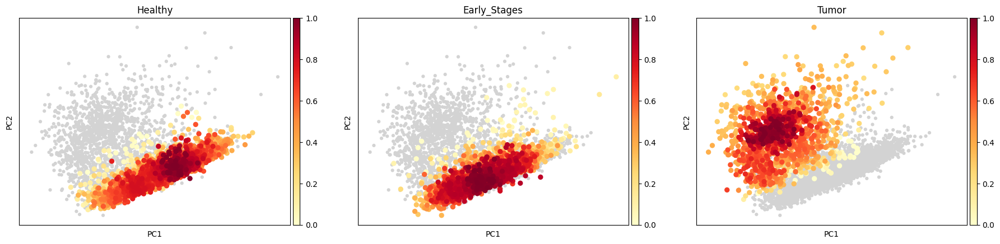

In [38]:
sc.pl.embedding_density(adata_cDC1, groupby="Stage", basis = "pca")

On voit une légère différence sur la densité mais rien de bien flagrant

/Users/mscavino/Thèse/scripts/scFunctions.py:27: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index()


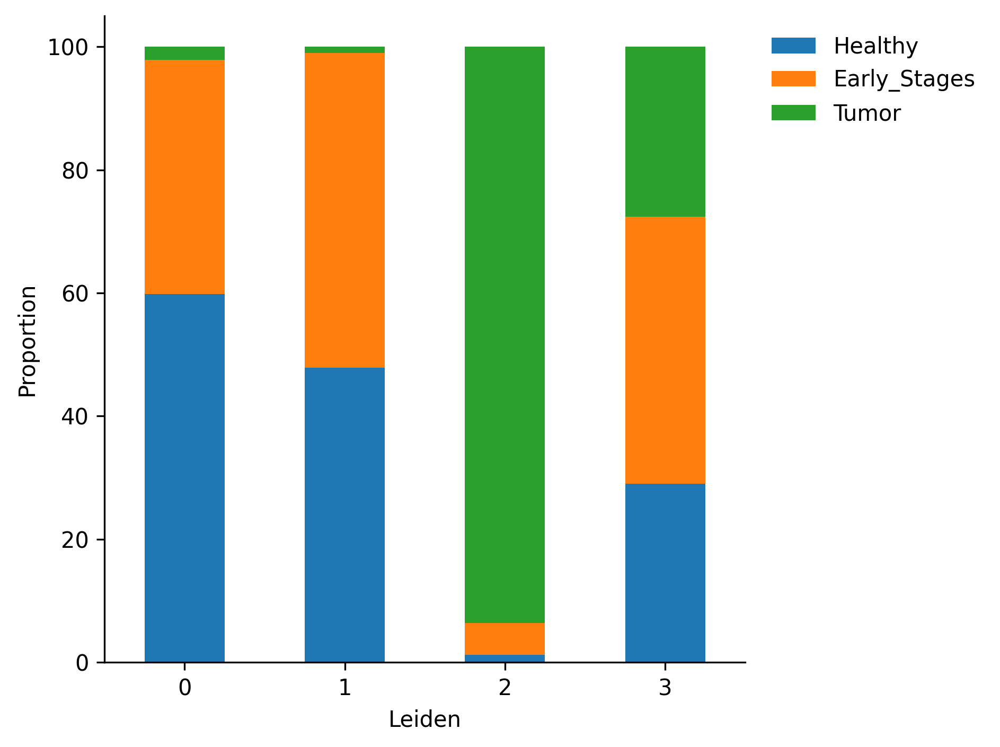

In [34]:
Stage_by_cluster = sf.get_cluster_proportions(adata_cDC1, cluster_key="Stage", sample_key="leiden")
fig = sf.plot_cluster_proportions(Stage_by_cluster)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


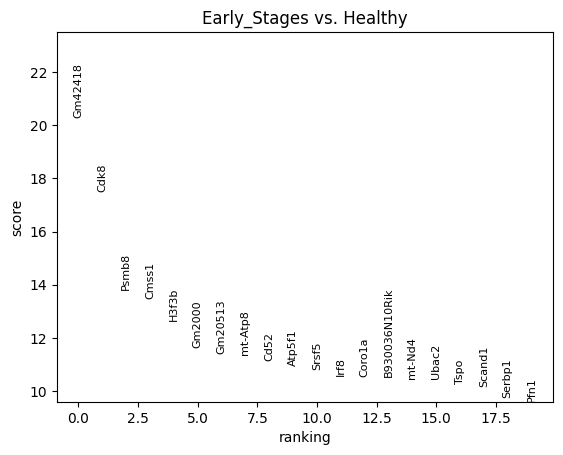

In [81]:
sc.tl.rank_genes_groups(adata_cDC1, 'Stage', groups=['Early_Stages'], reference='Healthy', method='wilcoxon')
sc.pl.rank_genes_groups(adata_cDC1, n_genes=20)

In [82]:
marker_es10_cDC1 = sc.get.rank_genes_groups_df(adata_cDC1, group='Early_Stages', pval_cutoff=0.01, log2fc_min=0)['names'].values[0:10]

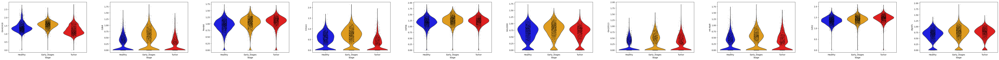

In [84]:
sc.pl.violin(adata_cDC1, marker_es10_cDC1 ,groupby="Stage")

In [85]:
sc.tl.rank_genes_groups(adata_cDC1, 'Stage', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Stage']`


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


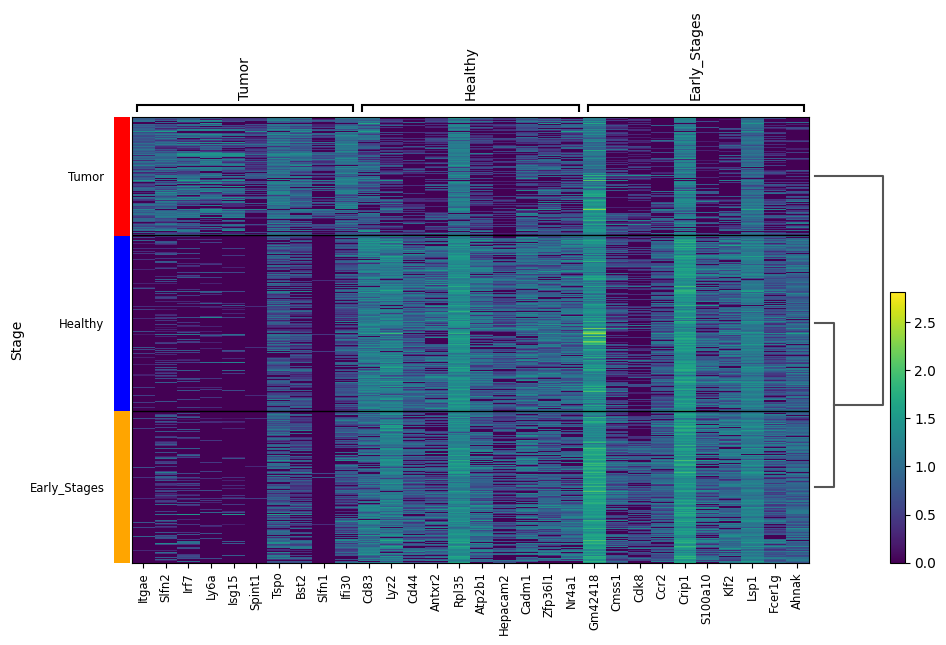

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


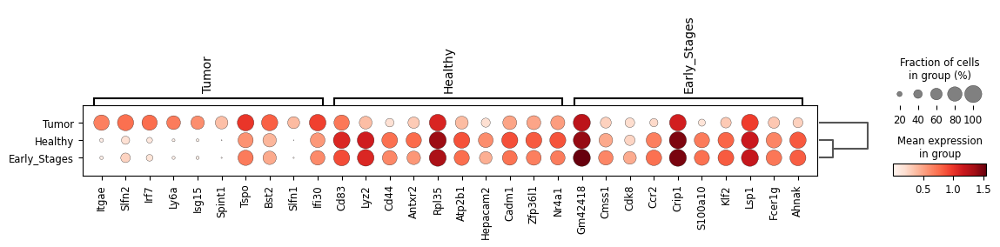

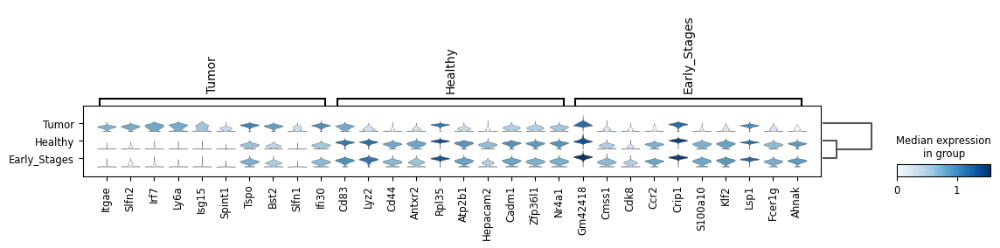

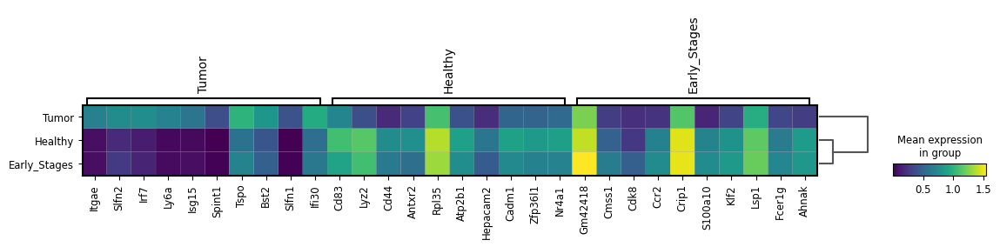

In [86]:
sc.pl.rank_genes_groups_heatmap(adata_cDC1, n_genes=10, show_gene_labels=True)
sc.pl.rank_genes_groups_dotplot(adata_cDC1, n_genes=10)
sc.pl.rank_genes_groups_stacked_violin(adata_cDC1, n_genes=10)
sc.pl.rank_genes_groups_matrixplot(adata_cDC1, n_genes=10)

## Enrichement analysis

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


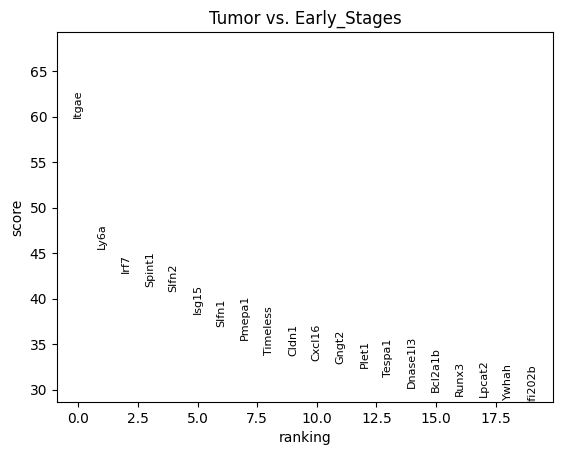

In [40]:
sc.tl.rank_genes_groups(adata_cDC1, 'Stage', groups=['Tumor'], reference='Early_Stages', method='t-test')
sc.pl.rank_genes_groups(adata_cDC1, n_genes=20)
marker_cDC1 = sc.get.rank_genes_groups_df(adata_cDC1, group='Tumor', pval_cutoff=0.01, log2fc_min=0)['names'].values

In [63]:
df = sc.queries.enrich(list(marker_cDC1),org = "mmusculus")

In [70]:
df

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,GO:CC,GO:0005737,cytoplasm,8.118466e-287,True,"""The contents of a cell excluding the plasma m...",11561,2918,2164,26995,0.741604,0.187181,query_1,"[GO:0005622, GO:0110165]"
1,GO:CC,GO:0005622,intracellular anatomical structure,4.964817e-178,True,"""A component of a cell contained within (but n...",17412,2918,2534,26995,0.868403,0.145532,query_1,[GO:0110165]
2,TF,TF:M00716,Factor: ZF5; motif: GSGCGCGR,8.431622e-138,True,Factor: ZF5; motif: GSGCGCGR,14823,2952,2576,21629,0.872629,0.173784,query_1,[TF:M00000]
3,GO:CC,GO:0043231,intracellular membrane-bounded organelle,2.582673e-135,True,"""Organized structure of distinctive morphology...",14435,2918,2181,26995,0.747430,0.151091,query_1,"[GO:0043227, GO:0043229]"
4,GO:CC,GO:0043229,intracellular organelle,9.973584e-133,True,"""Organized structure of distinctive morphology...",15836,2918,2310,26995,0.791638,0.145870,query_1,"[GO:0005622, GO:0043226]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1972,GO:BP,GO:0090114,COPII-coated vesicle budding,4.981896e-02,True,"""The evagination of an endoplasmic reticulum m...",38,2870,14,26944,0.004878,0.368421,query_1,"[GO:0006888, GO:0006900]"
1973,GO:BP,GO:1903573,negative regulation of response to endoplasmic...,4.981896e-02,True,"""Any process that stops, prevents or reduces t...",38,2870,14,26944,0.004878,0.368421,query_1,"[GO:0034976, GO:0048523, GO:0048585, GO:1905897]"
1974,GO:BP,GO:1900225,regulation of NLRP3 inflammasome complex assembly,4.981896e-02,True,"""Any process that modulates the frequency, rat...",38,2870,14,26944,0.004878,0.368421,query_1,"[GO:0043254, GO:0044546, GO:0141085]"
1975,GO:BP,GO:0045048,protein insertion into ER membrane,4.995045e-02,True,"""The process that results in incorporation of ...",29,2870,12,26944,0.004181,0.413793,query_1,"[GO:0007029, GO:0033365, GO:0051205]"


In [65]:
df[df["source"] == "GO:BP"]

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
13,GO:BP,GO:1901564,organonitrogen compound metabolic process,4.389465e-107,True,"""The chemical reactions and pathways involving...",5744,2870,1105,26944,0.385017,0.192375,query_1,"[GO:0006807, GO:0071704]"
28,GO:BP,GO:0019538,protein metabolic process,4.946561e-88,True,"""The chemical reactions and pathways involving...",4698,2870,919,26944,0.320209,0.195615,query_1,"[GO:0043170, GO:0044238, GO:1901564]"
44,GO:BP,GO:0051641,cellular localization,7.549279e-74,True,"""A cellular localization process whereby a sub...",3502,2870,718,26944,0.250174,0.205026,query_1,"[GO:0009987, GO:0051179]"
51,GO:BP,GO:0033036,macromolecule localization,7.427083e-69,True,"""Any process in which a macromolecule is trans...",3092,2870,647,26944,0.225436,0.209250,query_1,[GO:0051179]
52,GO:BP,GO:0051179,localization,1.673985e-68,True,"""Any process in which a cell, a substance, or ...",5364,2870,955,26944,0.332753,0.178039,query_1,[GO:0008150]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1972,GO:BP,GO:0090114,COPII-coated vesicle budding,4.981896e-02,True,"""The evagination of an endoplasmic reticulum m...",38,2870,14,26944,0.004878,0.368421,query_1,"[GO:0006888, GO:0006900]"
1973,GO:BP,GO:1903573,negative regulation of response to endoplasmic...,4.981896e-02,True,"""Any process that stops, prevents or reduces t...",38,2870,14,26944,0.004878,0.368421,query_1,"[GO:0034976, GO:0048523, GO:0048585, GO:1905897]"
1974,GO:BP,GO:1900225,regulation of NLRP3 inflammasome complex assembly,4.981896e-02,True,"""Any process that modulates the frequency, rat...",38,2870,14,26944,0.004878,0.368421,query_1,"[GO:0043254, GO:0044546, GO:0141085]"
1975,GO:BP,GO:0045048,protein insertion into ER membrane,4.995045e-02,True,"""The process that results in incorporation of ...",29,2870,12,26944,0.004181,0.413793,query_1,"[GO:0007029, GO:0033365, GO:0051205]"


/var/folders/0l/5dgm9v295cz3jngvfm2pmflh0000gn/T/ipykernel_8193/2761329316.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp["p_val"] = -1*np.log(temp["p_value"])


<AxesSubplot: xlabel='p_val', ylabel='name'>

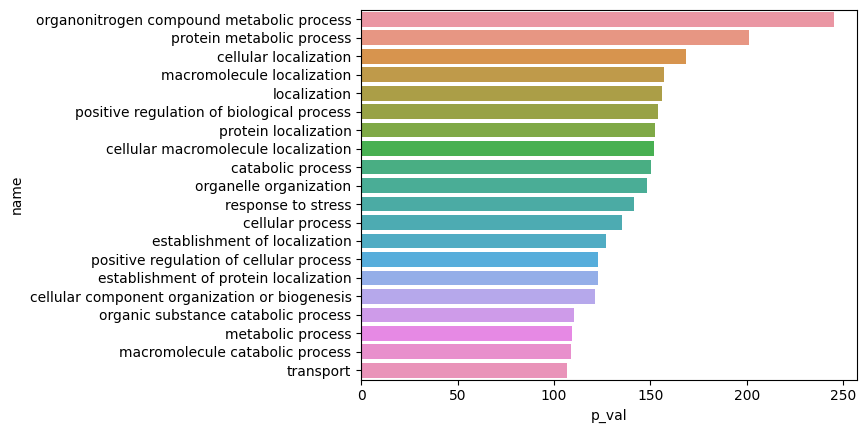

In [68]:
temp = df[df["source"] == "GO:BP"]
temp["p_val"] = -1*np.log(temp["p_value"])


sns.barplot(temp[0:20], x = "p_val", y = "name")

In [69]:
temp[0:20]

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents,p_val
13,GO:BP,GO:1901564,organonitrogen compound metabolic process,4.389465e-107,True,"""The chemical reactions and pathways involving...",5744,2870,1105,26944,0.385017,0.192375,query_1,"[GO:0006807, GO:0071704]",244.897398
28,GO:BP,GO:0019538,protein metabolic process,4.946561e-88,True,"""The chemical reactions and pathways involving...",4698,2870,919,26944,0.320209,0.195615,query_1,"[GO:0043170, GO:0044238, GO:1901564]",201.028796
44,GO:BP,GO:0051641,cellular localization,7.549279e-74,True,"""A cellular localization process whereby a sub...",3502,2870,718,26944,0.250174,0.205026,query_1,"[GO:0009987, GO:0051179]",168.369845
51,GO:BP,GO:0033036,macromolecule localization,7.427083e-69,True,"""Any process in which a macromolecule is trans...",3092,2870,647,26944,0.225436,0.209250,query_1,[GO:0051179],156.873238
52,GO:BP,GO:0051179,localization,1.673985e-68,True,"""Any process in which a cell, a substance, or ...",5364,2870,955,26944,0.332753,0.178039,query_1,[GO:0008150],156.060579
55,GO:BP,GO:0048518,positive regulation of biological process,1.178235e-67,True,"""Any process that activates or increases the f...",6589,2870,1107,26944,0.385714,0.168007,query_1,"[GO:0008150, GO:0050789]",154.109184
56,GO:BP,GO:0008104,protein localization,7.133137e-67,True,"""Any process in which a protein is transported...",2594,2870,569,26944,0.198258,0.219352,query_1,[GO:0070727],152.308450
57,GO:BP,GO:0070727,cellular macromolecule localization,1.166914e-66,True,"""Any process in which a macromolecule is trans...",2604,2870,570,26944,0.198606,0.218894,query_1,"[GO:0033036, GO:0051641]",151.816254
60,GO:BP,GO:0009056,catabolic process,5.933367e-66,True,"""The chemical reactions and pathways resulting...",2495,2870,552,26944,0.192334,0.221242,query_1,[GO:0008152],150.190024
64,GO:BP,GO:0006996,organelle organization,4.995124e-65,True,"""A process that is carried out at the cellular...",3518,2870,698,26944,0.243206,0.198408,query_1,[GO:0016043],148.059569


## Avec les cDC2

In [35]:
adata_cDC2 = adata[adata.obs['Population_new'] == 'cDC2', :].raw.to_adata().copy()
adata_cDC2

# Encore une fois je n'ai pas gradé les cDC2 en prolif

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/anndata/_core/raw.py:139: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  return anndata.AnnData(


AnnData object with n_obs × n_vars = 5780 × 25080
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population_new', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'features', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'Stage_colors', 'neighbors', 'umap', 'Population_new_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [36]:
adata_cDC2 = sf.pp_PCA(adata_cDC2) # Function defined in scFunction.py

# Normalize, Log-transform, select HVG, scale data and perform PCA

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


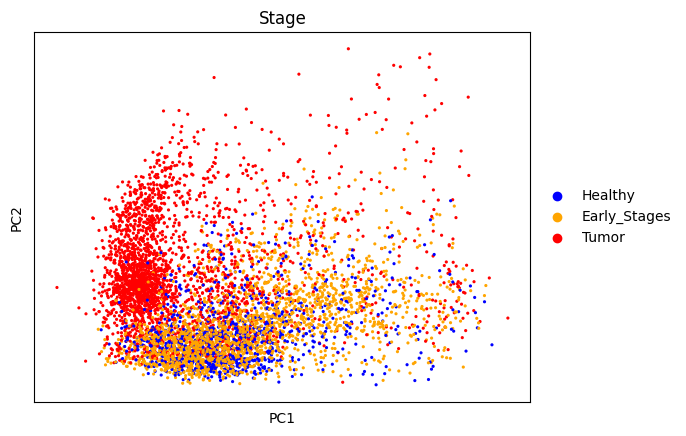

In [37]:
sc.pl.pca(adata_cDC2, color = "Stage", palette={"Healthy" : "blue", "Early_Stages" : "orange", "Tumor" : "red"})

L'ACP ne présume rien de bon si on veut séparer les Healthy et Early

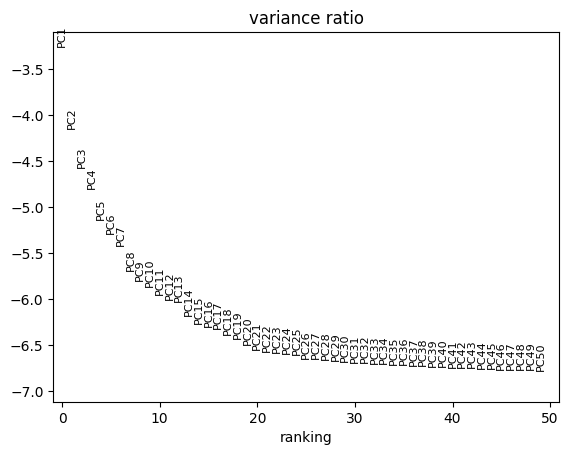

In [38]:
sc.pl.pca_variance_ratio(adata_cDC2, log=True, n_pcs = 50) #ndim = 20

In [39]:
sc.pp.neighbors(adata_cDC2, n_pcs=20)
sc.tl.umap(adata_cDC2)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:36)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


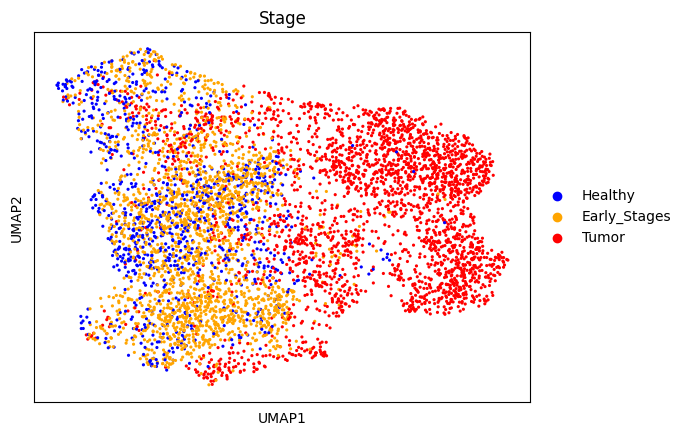

In [40]:
sc.pl.umap(adata_cDC2, color = "Stage")

computing density on 'umap'
--> added
    'umap_density_Stage', densities (adata.obs)
    'umap_density_Stage_params', parameter (adata.uns)


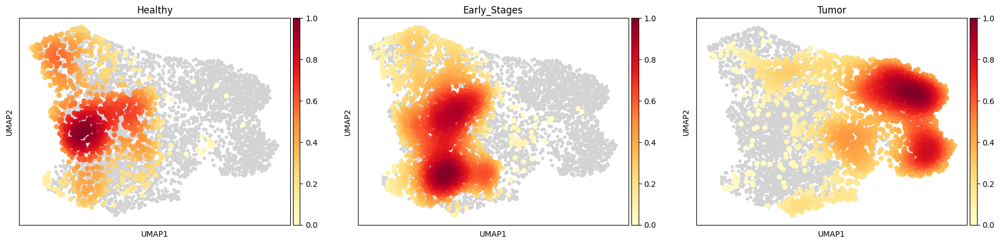

In [79]:
sc.tl.embedding_density(adata_cDC2, groupby="Stage")
sc.pl.embedding_density(adata_cDC2, groupby="Stage")

La densité montre une différence plus claire que la UMAP entre H et ES mais rien de fou

In [41]:
sc.tl.leiden(adata_cDC2, resolution = 0.3)

running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


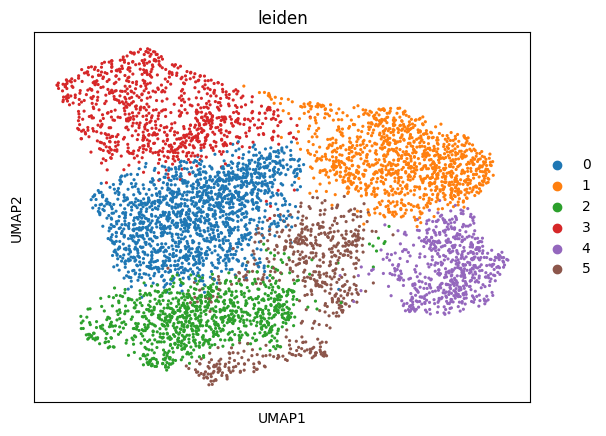

In [42]:
sc.pl.umap(adata_cDC2, color = "leiden")

/Users/mscavino/Thèse/scripts/scFunctions.py:27: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index()


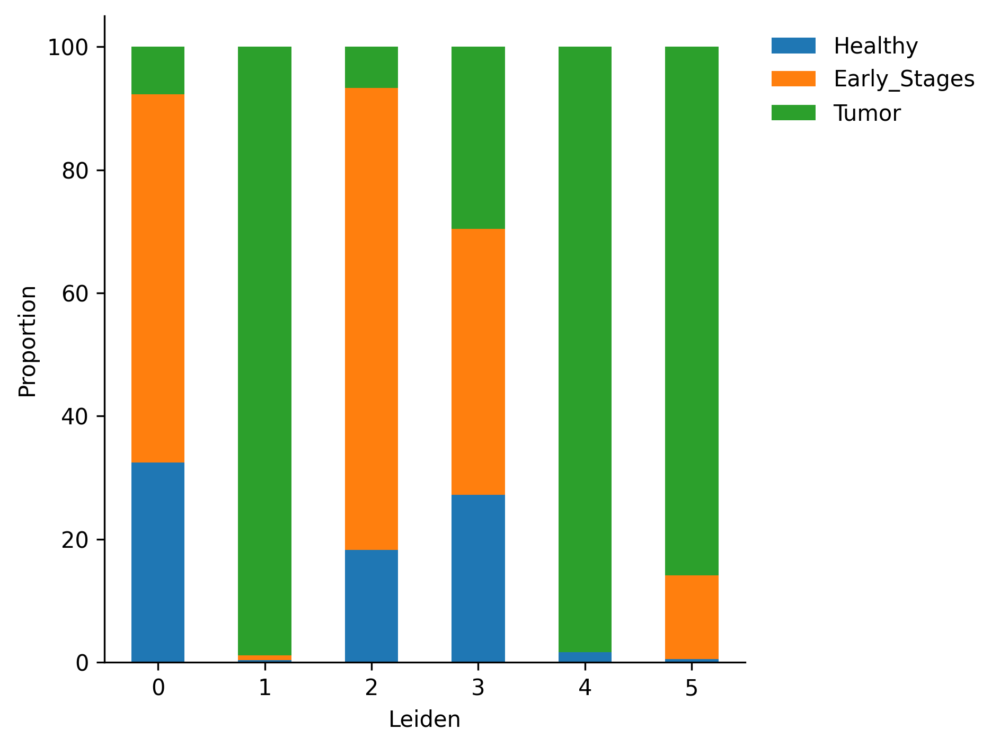

In [43]:
Stage_by_cluster = sf.get_cluster_proportions(adata_cDC2, cluster_key="Stage", sample_key="leiden")
fig = sf.plot_cluster_proportions(Stage_by_cluster)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


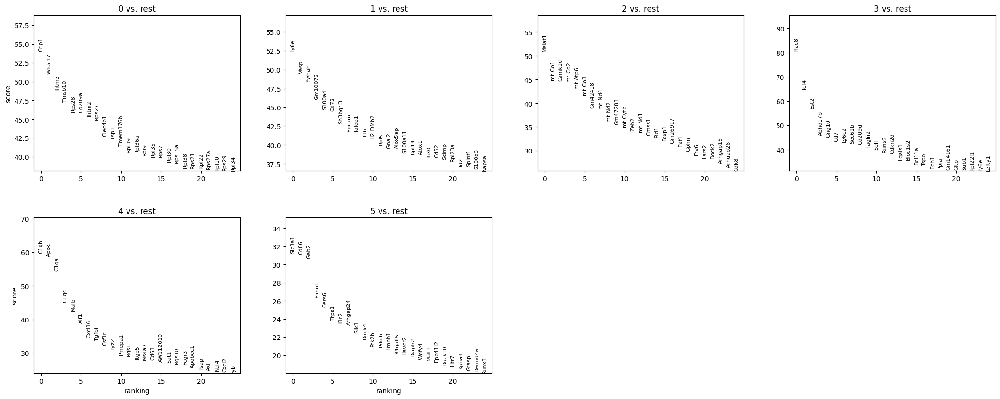

In [44]:
sc.tl.rank_genes_groups(adata_cDC2, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata_cDC2, n_genes=25, sharey=False)

**Clusters pas très bien définis sur la UMAP, difficile de trouver un cluster spécifique du stage prénéo**

**Je vais essayer avec une diffusion map**

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9862756  0.98417515 0.9722875  0.9492854  0.94690114
     0.943021   0.9361662  0.9273264  0.9244757  0.91174567 0.9092105
     0.89943415 0.8960736  0.89085096]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


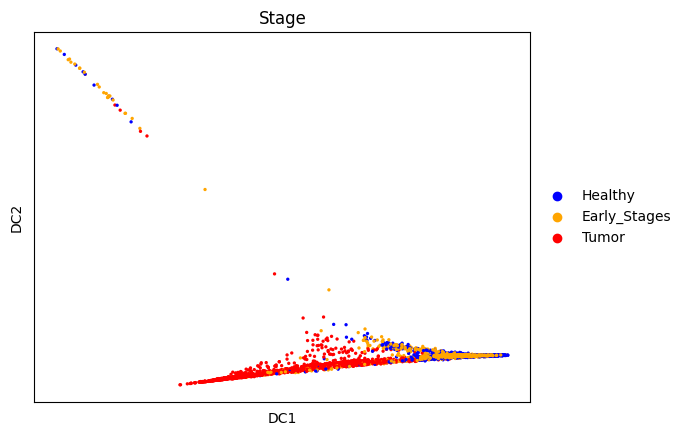

In [45]:
sc.tl.diffmap(adata_cDC1)
adata_cDC1.obsm["X_diffmap"] = adata_cDC1.obsm["X_diffmap"][:, 1:]
sc.pl.diffmap(adata_cDC1, color = "Stage")

computing Diffusion Maps using n_comps=20(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.98923546 0.9839848  0.9778765  0.97146106 0.9556953
     0.9524888  0.95025444 0.9435483  0.9387056  0.93607223 0.9315911
     0.9274417  0.92126787 0.9173888  0.91503274 0.91174483 0.90836656
     0.9057621  0.9024401 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


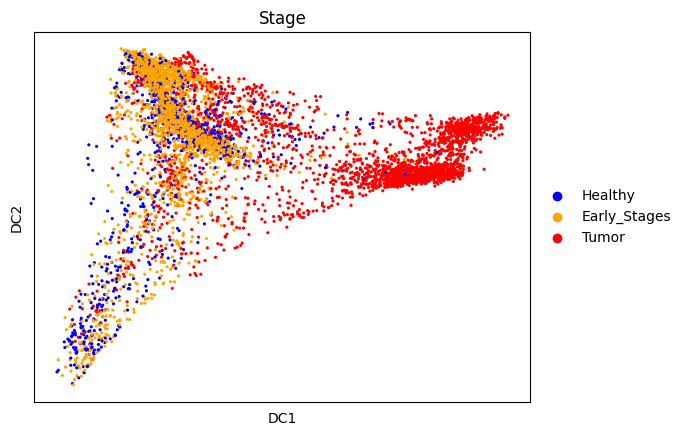

In [46]:
sc.tl.diffmap(adata_cDC2, n_comps=20)
adata_cDC2.obsm["X_diffmap"] = adata_cDC2.obsm["X_diffmap"][:, 1:]
sc.pl.diffmap(adata_cDC2, color='Stage')

running Leiden clustering
    finished: found 5 clusters and added
    'leiden_df', the cluster labels (adata.obs, categorical) (0:00:01)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


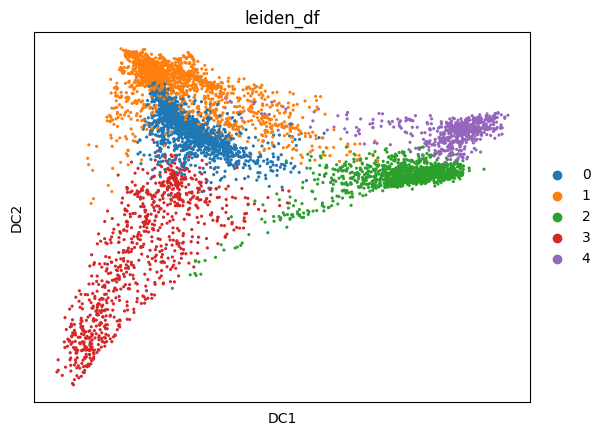

In [47]:
sc.tl.leiden(adata_cDC2, key_added='leiden_df', resolution = 0.2)
sc.pl.diffmap(adata_cDC2, color='leiden_df')

/Users/mscavino/Thèse/scripts/scFunctions.py:27: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index()


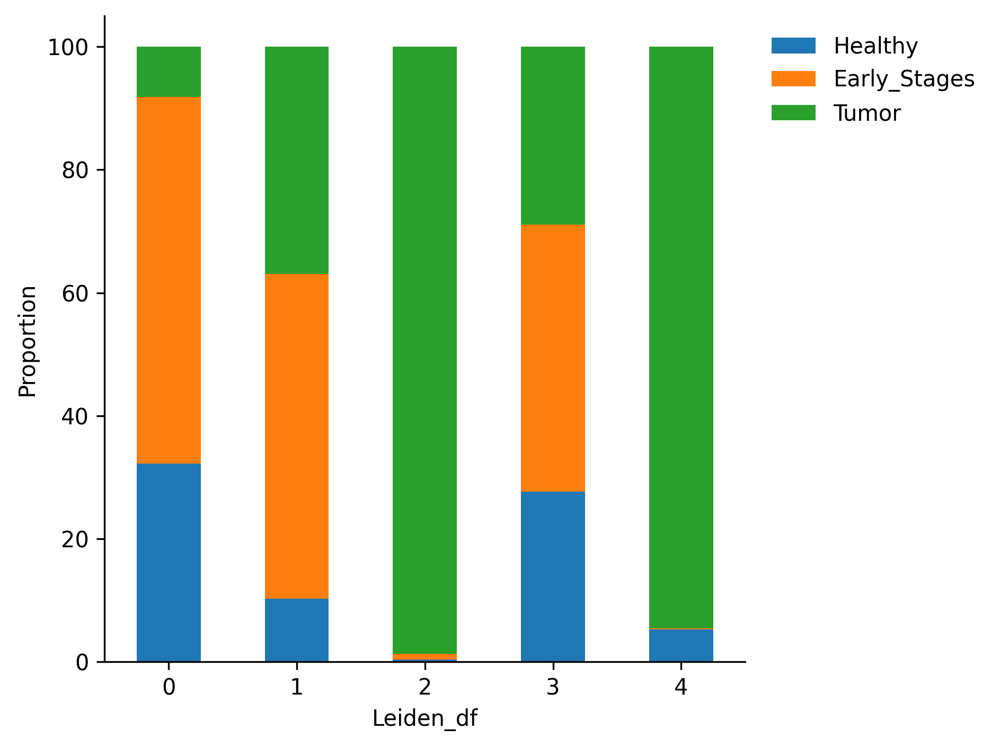

In [48]:
Stage_by_cluster = sf.get_cluster_proportions(adata_cDC2, cluster_key="Stage", sample_key="leiden_df")
fig = sf.plot_cluster_proportions(Stage_by_cluster)

**Pas très convaincant non plus je vais essayer d'analyser uniquement les H avec les ES pour voir si on trouve des différences**

- **Venn diagramm entre les DEG T vs H et T vs ES et ES vs H**
> **Voir si on retrrouve des DEG communs aux ES -> signature ?**


- **Essayer techniques pour séparer Healthy et early stages**

Voir velocite pour Leo L

# cDC1 Healthy/Early_stages

In [49]:
adata_cDC1_H_ES = adata_cDC1[adata_cDC1.obs['Stage'].isin(["Healthy", "Early_Stages"]), :].raw.to_adata().copy()
adata_cDC1_H_ES
# 3821 cellules

AnnData object with n_obs × n_vars = 3821 × 25080
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population_new', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'features', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'Stage_colors', 'neighbors', 'umap', 'Population_new_colors', 'leiden', 'leiden_colors', 'diffmap_evals'
    obsm: 'X_pca', 'X_umap', 'X_diffmap'
    obsp: 'distances', 'connectivities'

In [50]:
adata_cDC1_H_ES = sf.pp_PCA(adata_cDC1_H_ES) # Function defined in scFunction.py

# Normalize, Log-transform, select HVG, scale data and perform PCA

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


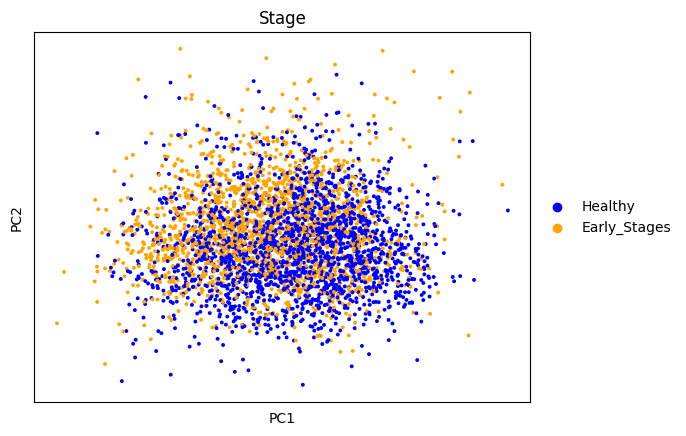

In [99]:
sc.pl.pca(adata_cDC1_H_ES, color = 'Stage')

Une ACP sans aucun signal

computing density on 'umap'
--> added
    'umap_density_Stage', densities (adata.obs)
    'umap_density_Stage_params', parameter (adata.uns)


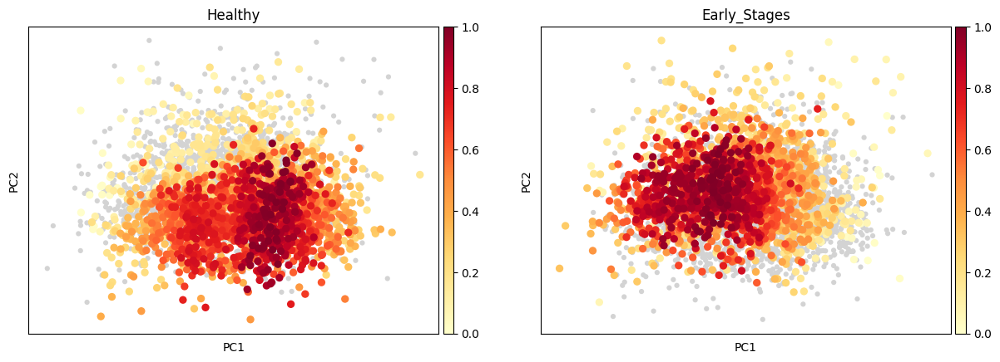

In [77]:
sc.tl.embedding_density(adata_cDC1_H_ES, groupby="Stage")
sc.pl.embedding_density(adata_cDC1_H_ES, basis="pca", groupby="Stage")

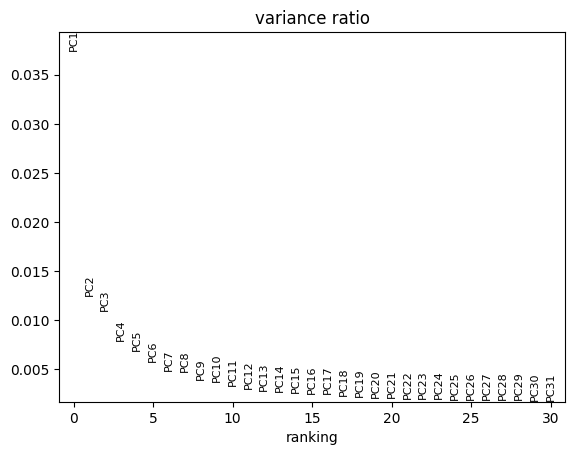

In [52]:
sc.pl.pca_variance_ratio(adata_cDC1_H_ES) #ndim = 10

In [53]:
sc.pp.neighbors(adata_cDC1_H_ES, n_pcs=10)
sc.tl.umap(adata_cDC1_H_ES)

computing neighbors
    using 'X_pca' with n_pcs = 10
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


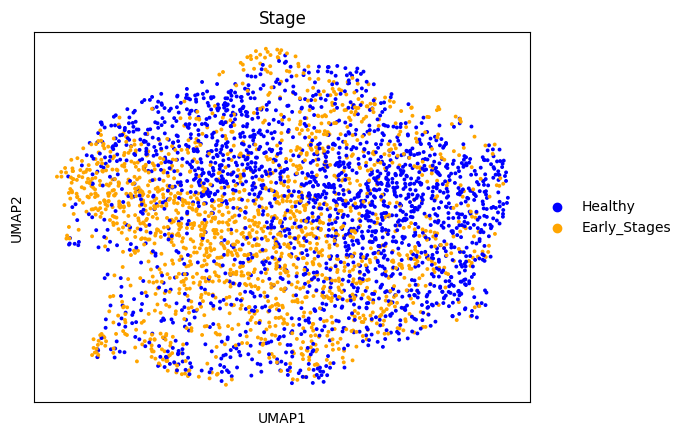

In [54]:
sc.pl.umap(adata_cDC1_H_ES, color = 'Stage')

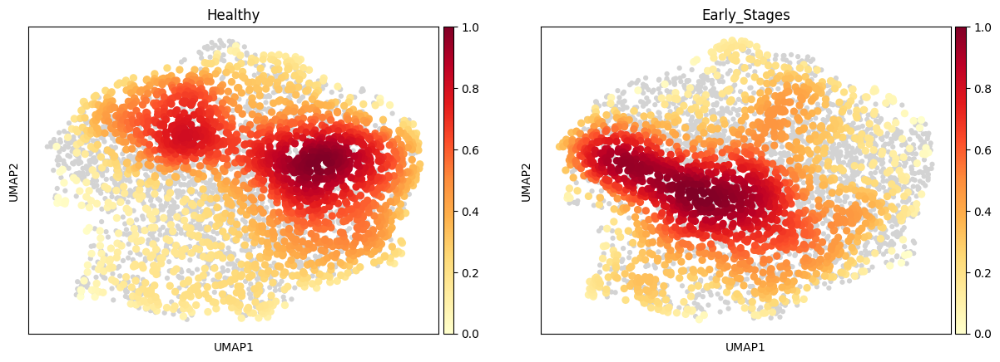

In [78]:
sc.pl.embedding_density(adata_cDC1_H_ES, groupby="Stage")

In [55]:
sc.tl.diffmap(adata_cDC1_H_ES, n_comps=10)
adata_cDC1_H_ES.obsm["X_diffmap"] = adata_cDC1_H_ES.obsm["X_diffmap"][:, 1:]

computing Diffusion Maps using n_comps=10(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.97459245 0.9608363  0.9462126  0.9342706  0.9238851
     0.9137621  0.9081765  0.90530384 0.90076554]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


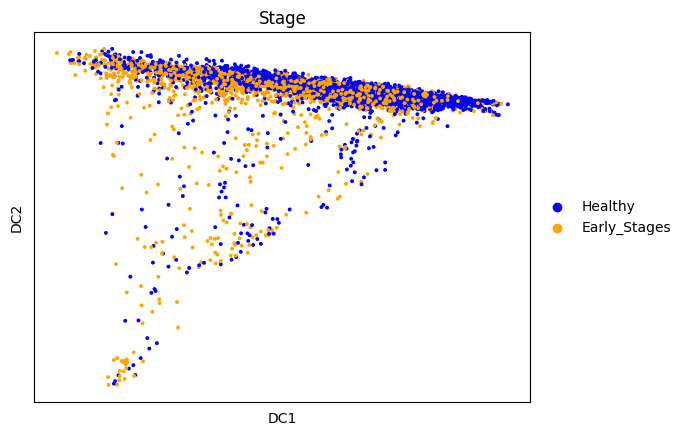

In [56]:
sc.pl.diffmap(adata_cDC1_H_ES, color='Stage')

Nul

# cDC1 Early stage/Tumor

In [57]:
adata_cDC1_ES_T = adata_cDC1[adata_cDC1.obs['Stage'].isin(["Early_Stages", "Tumor"]), :].raw.to_adata().copy()
adata_cDC1_ES_T
# 3197 cellules

AnnData object with n_obs × n_vars = 3197 × 25080
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population_new', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'features', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'Stage_colors', 'neighbors', 'umap', 'Population_new_colors', 'leiden', 'leiden_colors', 'diffmap_evals'
    obsm: 'X_pca', 'X_umap', 'X_diffmap'
    obsp: 'distances', 'connectivities'

In [58]:
adata_cDC1_ES_T = sf.pp_PCA(adata_cDC1_ES_T) # Function defined in scFunction.py

# Normalize, Log-transform, select HVG, scale data and perform PCA

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


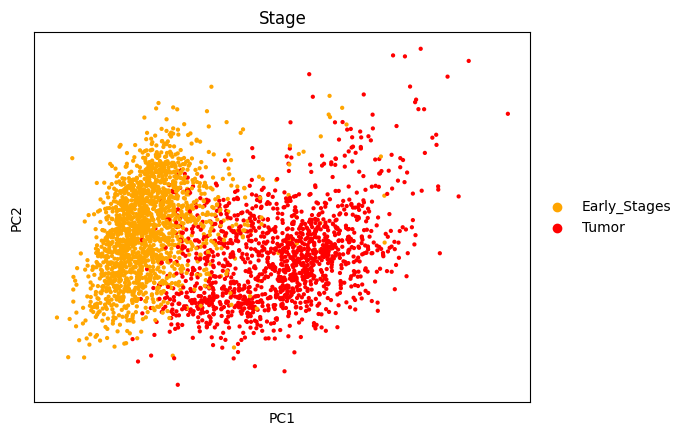

In [59]:
sc.pl.pca(adata_cDC1_ES_T, color = 'Stage')

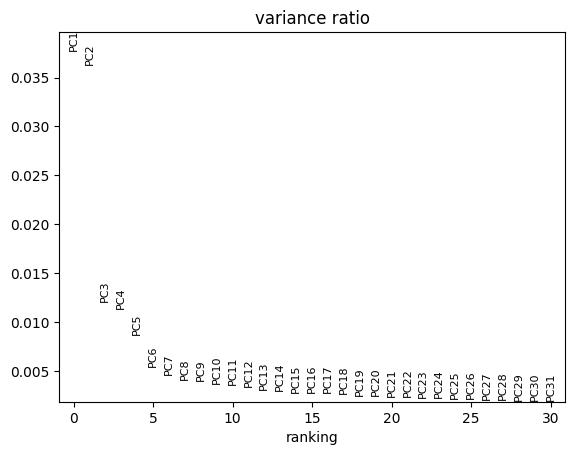

In [60]:
sc.pl.pca_variance_ratio(adata_cDC1_ES_T) #ndim = 10

In [61]:
sc.pp.neighbors(adata_cDC1_ES_T, n_pcs=10)
sc.tl.umap(adata_cDC1_ES_T)

computing neighbors
    using 'X_pca' with n_pcs = 10
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


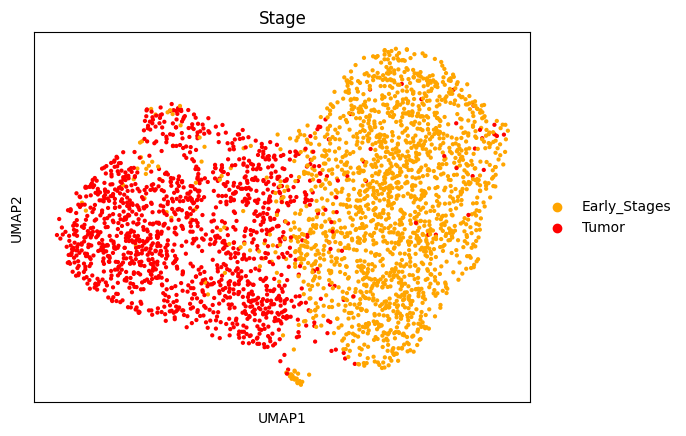

In [62]:
sc.pl.umap(adata_cDC1_ES_T, color = 'Stage')

In [63]:
sc.tl.diffmap(adata_cDC1_ES_T, n_comps=10)
adata_cDC1_ES_T.obsm["X_diffmap"] = adata_cDC1_ES_T.obsm["X_diffmap"][:, 1:]

computing Diffusion Maps using n_comps=10(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9865619  0.9757571  0.95935017 0.9523469  0.9483293
     0.94252336 0.9404392  0.9363425  0.9239889 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


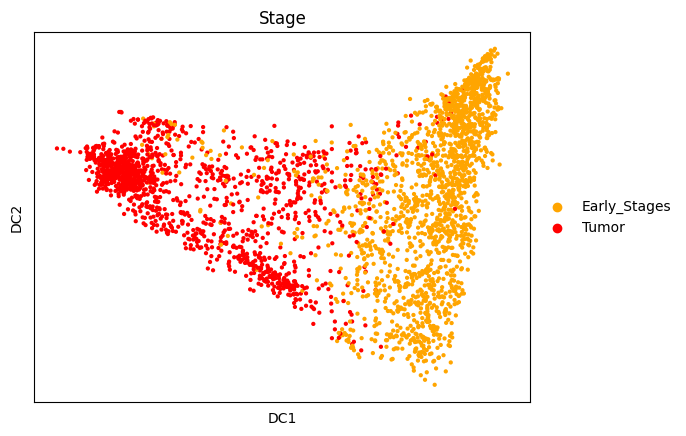

In [64]:
sc.pl.diffmap(adata_cDC1_ES_T, color = 'Stage')

Diffusion map pas très utile, les clusters se séparent bien sur la UMAP

# cDC1 Healthy/Tumor

In [65]:
adata_cDC1_H_T = adata_cDC1[adata_cDC1.obs['Stage'].isin(["Healthy", "Tumor"]), :].raw.to_adata().copy()
adata_cDC1_H_T
# 3454 cellules

AnnData object with n_obs × n_vars = 3454 × 25080
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population_new', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'features', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'Stage_colors', 'neighbors', 'umap', 'Population_new_colors', 'leiden', 'leiden_colors', 'diffmap_evals'
    obsm: 'X_pca', 'X_umap', 'X_diffmap'
    obsp: 'distances', 'connectivities'

In [66]:
adata_cDC1_H_T = sf.pp_PCA(adata_cDC1_H_T) # Function defined in scFunction.py

# Normalize, Log-transform, select HVG, scale data and perform PCA

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


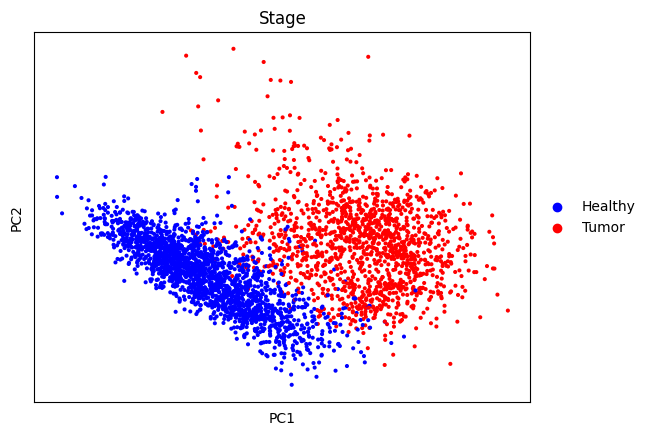

In [67]:
sc.pl.pca(adata_cDC1_H_T, color = 'Stage')

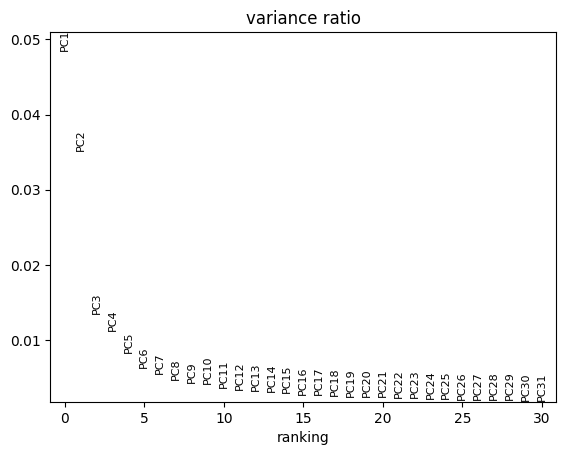

In [68]:
sc.pl.pca_variance_ratio(adata_cDC1_H_T) #ndim = 10

In [69]:
sc.pp.neighbors(adata_cDC1_H_T, n_pcs=10)
sc.tl.umap(adata_cDC1_H_T)

computing neighbors
    using 'X_pca' with n_pcs = 10
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


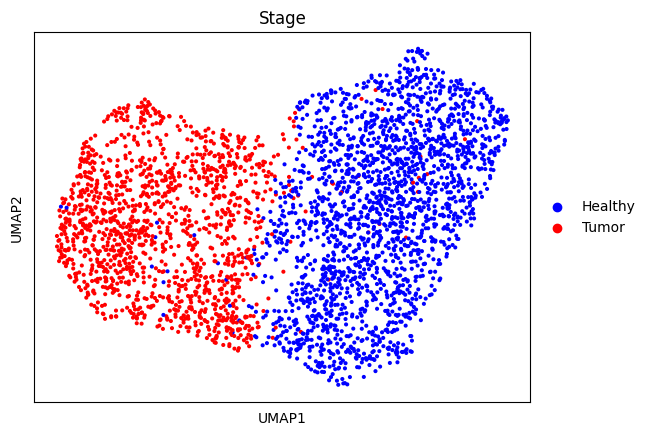

In [70]:
sc.pl.umap(adata_cDC1_H_T, color = 'Stage')

In [71]:
sc.tl.diffmap(adata_cDC1_H_T, n_comps=10)
adata_cDC1_H_T.obsm["X_diffmap"] = adata_cDC1_H_T.obsm["X_diffmap"][:, 1:]

computing Diffusion Maps using n_comps=10(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.98921937 0.9751801  0.9570022  0.94970506 0.9492502
     0.943728   0.9368398  0.9337126  0.922822  ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


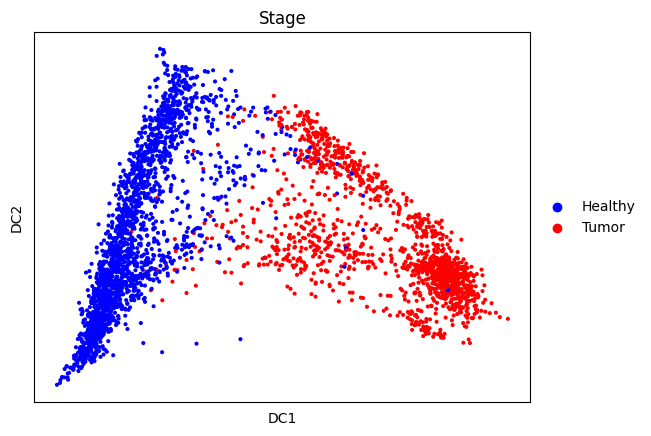

In [72]:
sc.pl.diffmap(adata_cDC1_H_T, color = 'Stage')

Encore une fois diffmap pas très utile (umap non plus) car on a 2 clusters bien définis.

**On va pouvoir calculer les DEG 2 à 2 entre les 3 stades de développement de la tumeur**

Le but étant de trouver des DEGs spécifiques du ES

In [100]:
sc.tl.rank_genes_groups(adata_cDC1_H_ES, "Stage")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


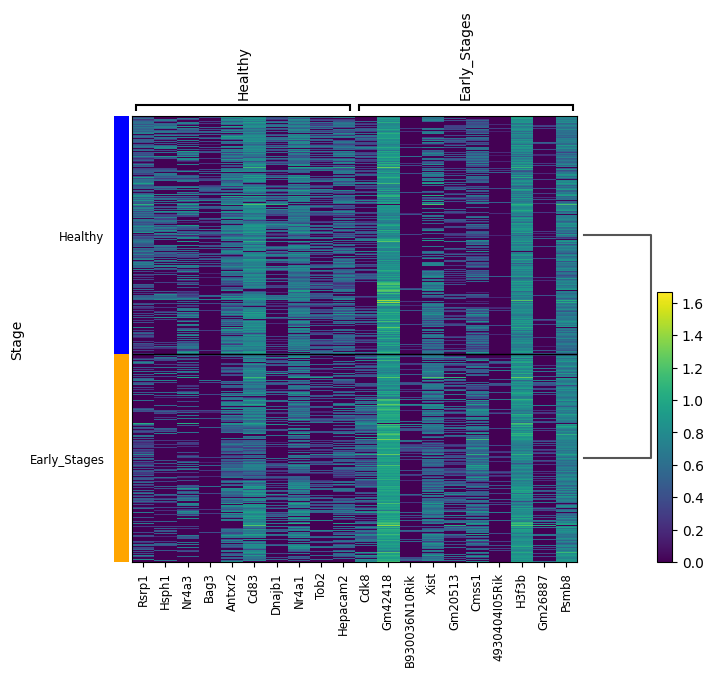

In [101]:
sc.pl.rank_genes_groups_heatmap(adata_cDC1_H_ES)

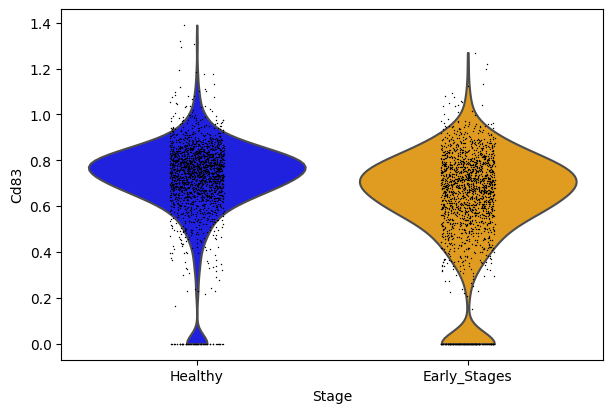

In [102]:
sc.pl.violin(adata_cDC1_H_ES, "Cd83", groupby="Stage")

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


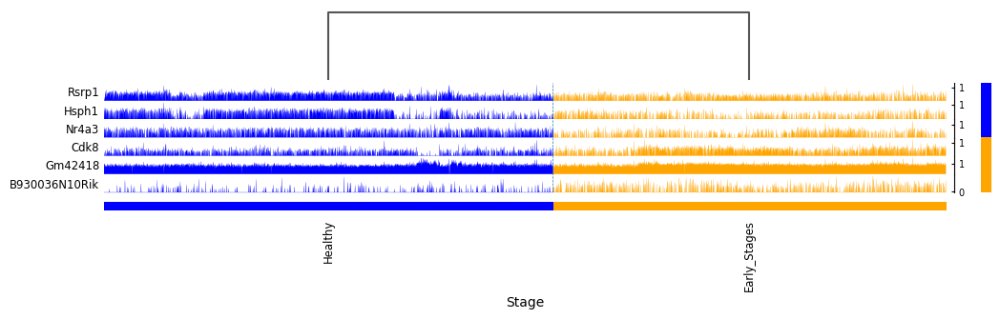

In [103]:
sc.pl.rank_genes_groups_tracksplot(adata_cDC1_H_ES, n_genes=3)

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


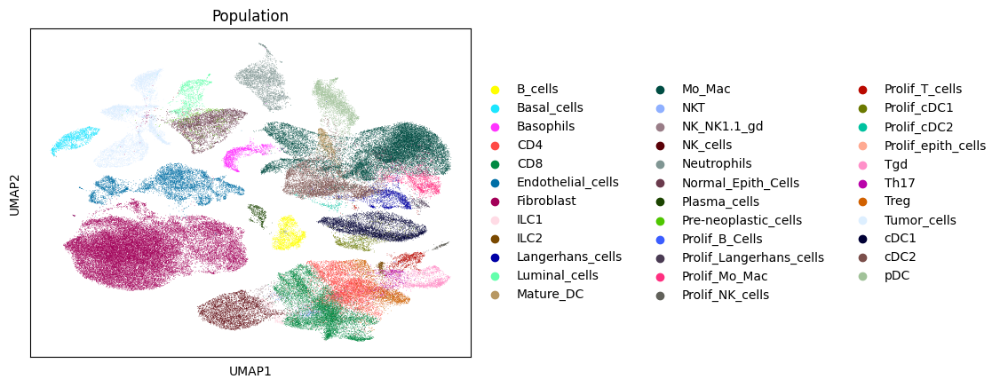

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


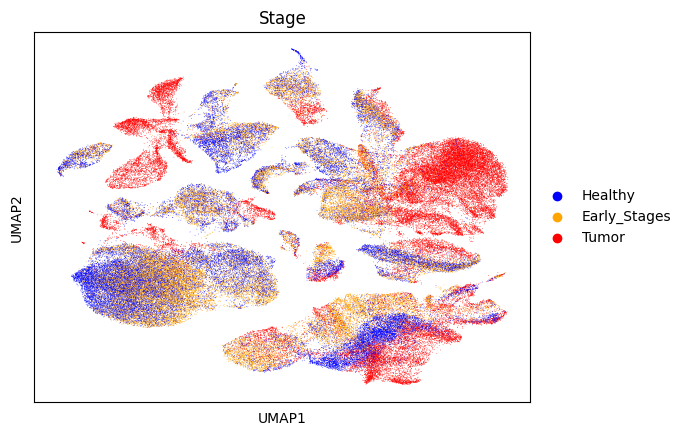

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


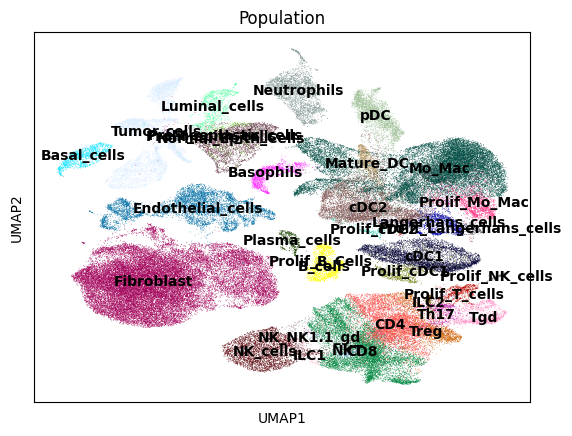

In [89]:
sc.pl.umap(adata, color = "Population")
sc.pl.umap(adata, color = "Stage")
sc.pl.umap(adata, color = "Population", legend_loc= "on data")

Aucun DEG intéressant entre H et ES Mais Cdk8 qui ressort et qui sortait bien pour les LB entre H et ES donc c'est un gène potentiellement intéressant

# Neutrophils

In [90]:
adata_neutro = adata[adata.obs['Population'] == 'Neutrophils', :].raw.to_adata().copy()
adata_neutro

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/anndata/_core/raw.py:139: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  return anndata.AnnData(


AnnData object with n_obs × n_vars = 3097 × 25572
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population', 'Mouse_ID', 'Week_post Cre_activation', 'Sub_class_Stage', 'Mammary_glands', 'mouse_age_(Week)', 'new_orig'
    var: 'features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'Stage_colors', 'neighbors', 'umap', 'new_orig_colors', 'Population_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [91]:
adata_neutro = sf.pp_PCA(adata_neutro) # Function defined in scFunction.py

# Normalize, Log-transform, select HVG, scale data and perform PCA

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


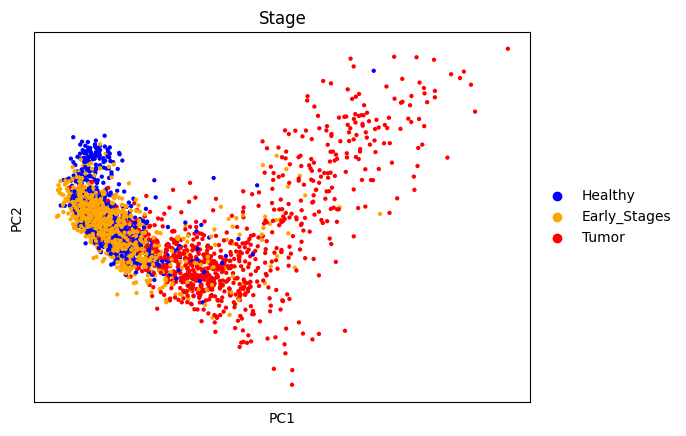

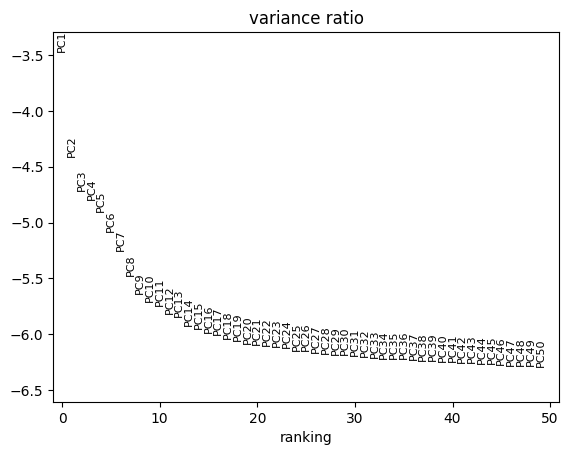

In [92]:
sc.pl.pca(adata_neutro, color = "Stage", palette={"Healthy" : "blue", "Early_Stages" : "orange", "Tumor" : "red"})
sc.pl.pca_variance_ratio(adata_neutro, log=True, n_pcs = 50) #ndim = 10

In [93]:
sc.pp.neighbors(adata_neutro, n_pcs=10)
sc.tl.umap(adata_neutro)

computing neighbors
    using 'X_pca' with n_pcs = 10
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


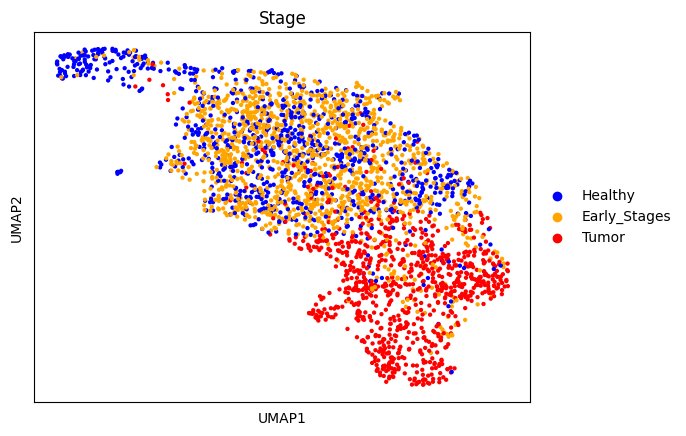

In [94]:
sc.pl.umap(adata_neutro, color = "Stage")

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9894932  0.98569304 0.967055   0.9549651  0.94321287
     0.9394188  0.93315595 0.92939866 0.9238043  0.91754955 0.91244674
     0.9065445  0.89822733 0.89226496]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


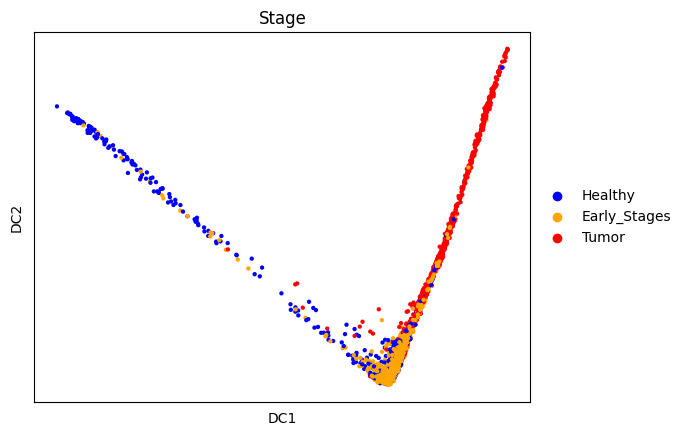

In [95]:
sc.tl.diffmap(adata_neutro)
adata_neutro.obsm["X_diffmap"] = adata_neutro.obsm["X_diffmap"][:, 1:]
sc.pl.diffmap(adata_neutro, color = "Stage")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


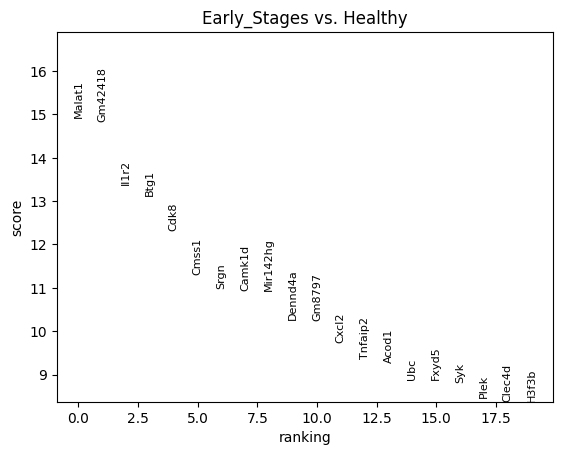

In [96]:
sc.tl.rank_genes_groups(adata_neutro, 'Stage', groups=['Early_Stages'], reference='Healthy', method='wilcoxon')
sc.pl.rank_genes_groups(adata_neutro, n_genes=20)

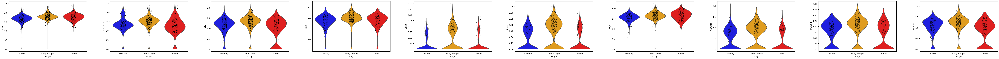

In [97]:
marker_es10 = sc.get.rank_genes_groups_df(adata_neutro, group='Early_Stages', pval_cutoff=0.01, log2fc_min=0)['names'].values[0:10]

sc.pl.violin(adata_neutro, marker_es10, groupby="Stage")

In [98]:
sc.tl.rank_genes_groups(adata_neutro, 'Stage', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Stage']`


/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


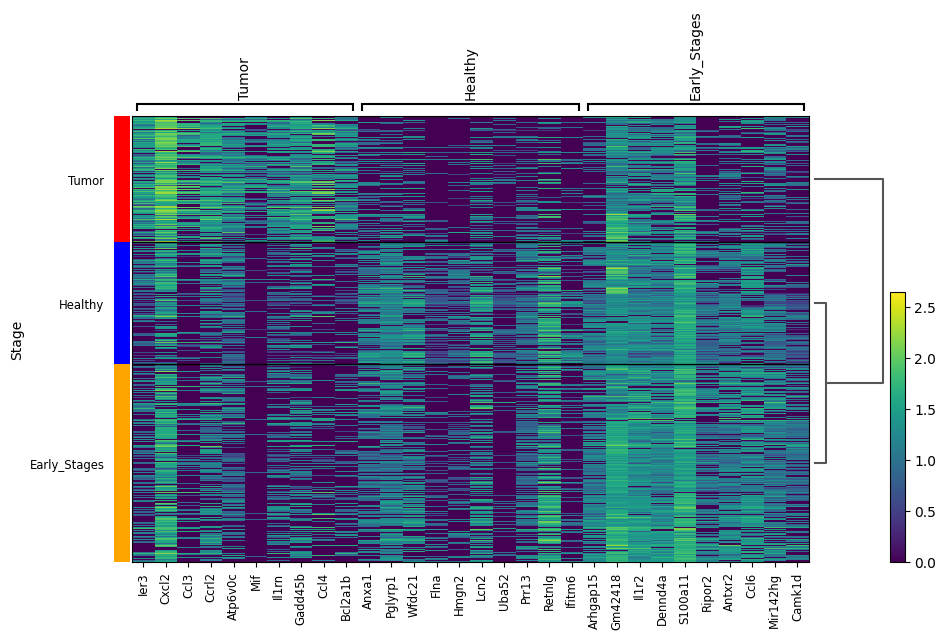

/Users/mscavino/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


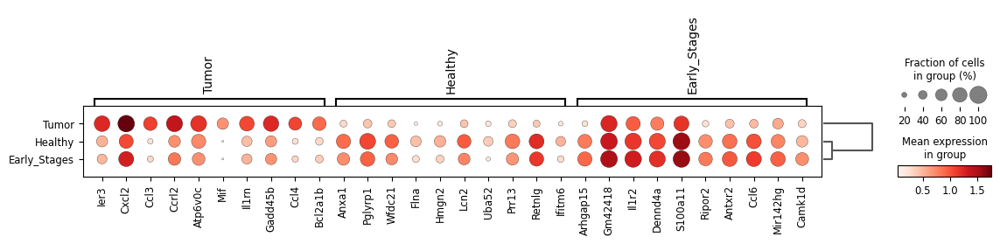

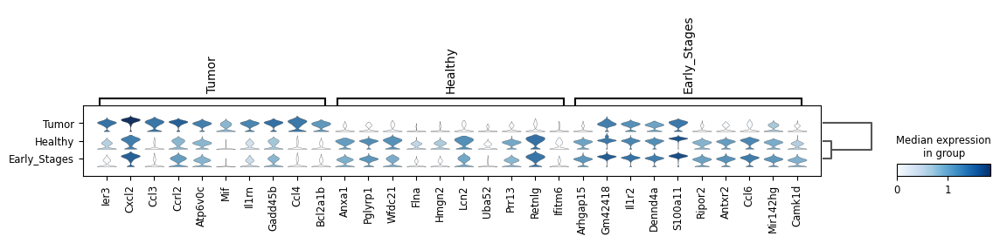

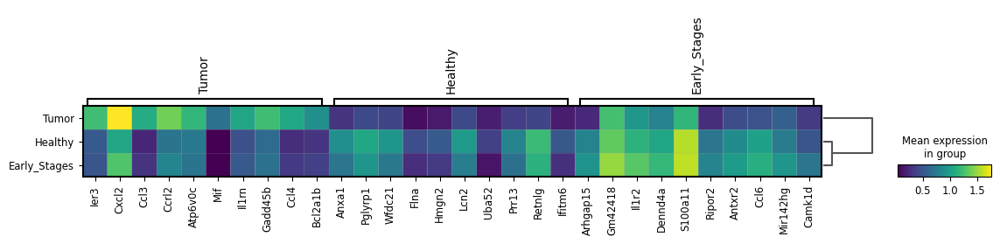

In [99]:
sc.pl.rank_genes_groups_heatmap(adata_neutro, n_genes=10, show_gene_labels=True)
sc.pl.rank_genes_groups_dotplot(adata_neutro, n_genes=10)
sc.pl.rank_genes_groups_stacked_violin(adata_neutro, n_genes=10)
sc.pl.rank_genes_groups_matrixplot(adata_neutro, n_genes=10)